In [66]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from scipy import signal
from scipy.integrate import simps
from scipy.fftpack import fft
from scipy.signal import resample
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm_notebook as tqdm

<p>Directory</p>

In [2]:
dir = "C:/Users/我的电脑/desktop/Harvard/WearableDevicesAndComputerVision/project/data3/"

<p>Files in Directory and summary of their data</p>

In [3]:
files = os.listdir(dir+'FreeThrows_7_31')
md = pd.read_csv(dir+'motion_data.csv')

<p>Functions for removing data before data around the shot and calculating the final velocity of the ball</p>

In [4]:
def trim_data(w,a):
    w2 = w['wx']**2 + w['wy']**2 + w['wz']**2
    a2 = a['ax']**2 + a['ay']**2 + a['az']**2
    center_index = w2.idxmax()
    empty_frame = (pd.DataFrame([],columns=w.columns),pd.DataFrame([],columns=a.columns))
    if w2.max()>2250000 and center_index-5>=0 and center_index+5<len(w2):
        start_index = center_index
        stop_index = center_index
        while (sum(list(w2[start_index:start_index+5]))/5 >50 or (w['time'][center_index]-w['time'][start_index])<200)\
        and start_index>1:
            start_index -= 1
        while sum(list(w2[stop_index-5:stop_index]))/5 >50 and stop_index<len(w2)-1:
            stop_index += 1
        start_time = w['time'][start_index]
        stop_time = w['time'][stop_index]
        w = w[w['time']>=start_time]
        w = w[w['time']<=stop_time]
        a = a[a['time']>=start_time]
        a = a[a['time']<=stop_time]
        w = w.reset_index()
        a = a.reset_index()
        return (w,a)
    else:
        return empty_frame

def get_v(w, a):
    g = np.sqrt(a['ax'][0]**2+a['ay'][0]**2+a['az'][0]**2)
    v = np.array([0, 0, 0])
    phi = np.arctan(a['ay'][0]/a['ax'][0])
    theta = np.arctan(np.sqrt(a['ax'][0]**2+a['ay'][0]**2)/a['az'][0])
    x = [1, 0, 0]
    y = [0, 1, 0]
    z = [0, 0, 1]
    Ry = [[np.cos(theta),0,-np.sin(theta)], [0,1,0], [np.sin(theta),1,np.cos(theta)]]
    Rz = [[np.cos(phi),-np.sin(phi),0], [np.sin(phi),np.cos(phi),0], [0,0,1]]
    xp = np.matmul(Rz,np.matmul(Ry,x))
    yp = np.matmul(Rz,np.matmul(Ry,y))
    zp = np.matmul(Rz,np.matmul(Ry,z))
    
    for n in range(len(w)-1):
        dt = (w['time'][n+1]-w['time'][n])/1000
        phi = np.arctan(a['ay'][0]/a['ax'][0])
        theta = np.arctan(np.sqrt(a['ax'][0]**2+a['ay'][0]**2)/a['az'][0])
        G = np.matmul(Rz,np.matmul(Ry,z))*g/1000*9.8
        v = v + (a['ax'][n]*xp+a['ay'][n]*yp+a['az'][n]*zp+G)*9.8/1000*dt
        wv = np.array([w['wx'][n], w['wy'][n], w['wz'][n]])*np.pi/180
        xn = xp + dt*np.cross(wv,xp)
        yn = yp + dt*np.cross(wv,yp)
        zn = zp + dt*np.cross(wv,zp)
        xp = xn/np.sqrt(np.dot(xn,xn))
        yp = yn/np.sqrt(np.dot(yn,yn))
        zp = zn/np.sqrt(np.dot(zn,zn))
    return v

<p>This is the general structure of the saved csv files</p>

In [5]:
w = pd.read_csv(dir+'FreeThrows_7_31/'+files[5])
a = pd.read_csv(dir+'FreeThrows_7_31/'+files[4])
w.head()

,time,wx,wy,wz
0,67392,-2.4,-2.5,0.0
1,67423,-3.6,3.7,0.0
2,67429,-3.5,0.5,0.5
3,67435,-2.3,3.1,0.1
4,67441,-3.1,4.5,0.0


In [6]:
a.head()

,time,ax,ay,az
0,67392,389,628,-616
1,67423,372,641,-612
2,67429,378,625,-623
3,67435,380,632,-634
4,67441,372,631,-609


In [7]:
md.head()

,int_ax,ax_min,ax_max,int_ay,ay_min,ay_max,int_az,az_min,az_max,gyr_x_min,...,gyr_y_max,gyr_z_min,gyr_z_max,make,left,right,short,long,suggestion,file_name
0,8.285634e+04,-1998.0,1294.0,5.380358e+05,-1998.0,1144.0,-3.763477e+05,-1996.0,1998.0,-1088.2,...,2261.0,-571.7,205.1,1,0,0,0,0,ns,1596167614
1,1.760021e+05,-1998.0,1998.0,7.166324e+05,-1973.0,1996.0,-8.833387e+04,-1996.0,1998.0,-285.5,...,1901.9,-303.5,355.6,1,0,0,0,0,ns,1596167636
2,1.797800e+05,-1998.0,1468.0,6.810075e+05,-1998.0,1859.0,-4.011383e+04,-1996.0,1998.0,-494.9,...,1611.8,-189.4,263.7,0,0,0,1,0,ns,1596167781
3,1.781615e+03,-1998.0,1112.0,9.295137e+05,-1608.0,1950.0,1.457665e+05,-1996.0,1998.0,-500.9,...,940.3,-444.2,552.7,1,0,0,0,0,ns,1596167828
4,-6.256671e+06,-1998.0,1980.0,1.040170e+06,-692.0,1996.0,5.606436e+06,-1996.0,1996.0,-525.1,...,998.9,-561.0,827.8,0,0,0,1,0,ns,1596167850


<p>This is the graphed data for one shot attempt</p>

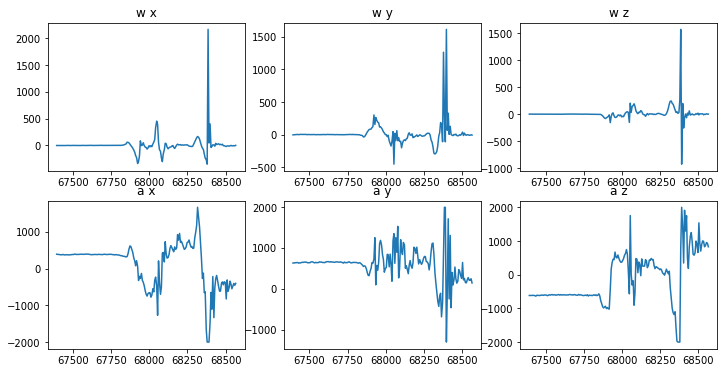

In [8]:
w = pd.read_csv(dir+'FreeThrows_7_31/'+files[5])
a = pd.read_csv(dir+'FreeThrows_7_31/'+files[4])

fig, ax = plt.subplots(2,3, figsize=(12,6))

ax[0, 0].set_title('w x')
ax[0, 0].plot(w['time'], w['wx'])

ax[0, 1].set_title('w y')
ax[0, 1].plot(w['time'], w['wy'])

ax[0, 2].set_title('w z')
ax[0, 2].plot(w['time'], w['wz'])

ax[1, 0].set_title('a x')
ax[1, 0].plot(a['time'], a['ax'])

ax[1, 1].set_title('a y')
ax[1, 1].plot(a['time'], a['ay'])

ax[1, 2].set_title('a z')
ax[1, 2].plot(a['time'], a['az'])

plt.show()

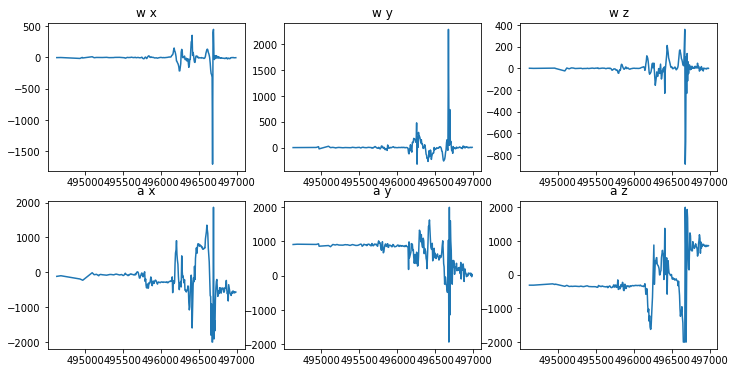

In [9]:
w = pd.read_csv(dir+'FreeThrows_7_31/'+files[199])
a = pd.read_csv(dir+'FreeThrows_7_31/'+files[198])

fig, ax = plt.subplots(2,3, figsize=(12,6))

ax[0, 0].set_title('w x')
ax[0, 0].plot(w['time'], w['wx'])

ax[0, 1].set_title('w y')
ax[0, 1].plot(w['time'], w['wy'])

ax[0, 2].set_title('w z')
ax[0, 2].plot(w['time'], w['wz'])

ax[1, 0].set_title('a x')
ax[1, 0].plot(a['time'], a['ax'])

ax[1, 1].set_title('a y')
ax[1, 1].plot(a['time'], a['ay'])

ax[1, 2].set_title('a z')
ax[1, 2].plot(a['time'], a['az'])

plt.show()

<p>Comparing the average period</p>

In [10]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, a = trim_data(w,a)
        if len(a)>10:
            misses.append(a['time'][len(a)-1]-a['time'][0])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, a = trim_data(w,a)
        if len(a)>10:
            makes.append(a['time'][len(a)-1]-a['time'][0])
makes = np.array(makes)
     

print('period makes   mean: '+str(makes.mean())+' std:'+str(makes.std()))
print('period misses  mean: '+str(misses.mean())+' std:'+str(misses.std()))
print('z-statistic: '+str(abs(makes.mean()-misses.mean())/makes.std()))


period makes   mean: 871.2826086956521 std:83.07426301691399
period misses  mean: 881.8809523809524 std:61.61060606783016
z-statistic: 0.1275767403815842


<p>Comparing the integration of the acceleration variable without accoutning for direction</p>

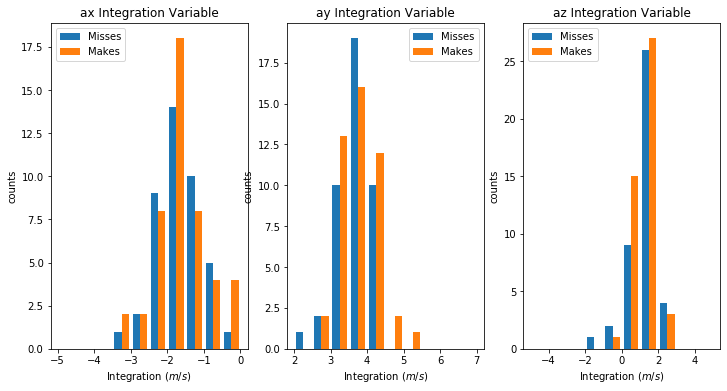

ax integration makes   mean: -1.6326013734299518 std:0.6811060409074774
ax integration misses  mean: -1.673711401851852 std:0.6067831397503904
z-statistic: 0.06035775041302945
ay integration makes   mean: 3.8022721929347827 std:0.49620340424355414
ay integration misses  mean: 3.6613122875 std:0.458816775187129
z-statistic: 0.2840768608785978
az integration makes   mean: 1.1463512599033816 std:0.5774690990188726
az integration misses  mean: 1.13954166712963 std:0.7821073718540537
z-statistic: 0.011792133614285666


In [11]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            misses.append([simps(9.8*data['ax'],data['time'])/10**6,simps(9.8*data['ay'],data['time'])/10**6,\
                           simps(9.8*data['az'],data['time'])/10**6])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            makes.append([simps(9.8*data['ax'],data['time'])/10**6,simps(9.8*data['ay'],data['time'])/10**6,\
                          simps(9.8*data['az'],data['time'])/10**6])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]], range=(-5,0))
ax[0].legend(('Misses', 'Makes'))
ax[0].set_ylabel('counts')
ax[0].set_xlabel('Integration ($m/s$)')
ax[0].set_title('ax Integration Variable')
ax[1].hist([misses[:,1], makes[:,1]], range=(2,7))
ax[1].legend(('Misses', 'Makes'))
ax[1].set_ylabel('counts')
ax[1].set_xlabel('Integration ($m/s$)')
ax[1].set_title('ay Integration Variable')
ax[2].hist([misses[:,2], makes[:,2]], range=(-5,5))
ax[2].legend(('Misses', 'Makes'))
ax[2].set_ylabel('counts')
ax[2].set_xlabel('Integration ($m/s$)')
ax[2].set_title('az Integration Variable')
plt.show()      

print('ax integration makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('ax integration misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('ay integration makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('ay integration misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('az integration makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('az integration misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

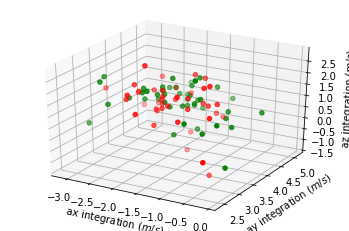

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

int_x_misses = misses[:,0]
int_y_misses = misses[:,1]
int_z_misses = misses[:,2] 
ax.scatter(int_x_misses, int_y_misses, int_z_misses, c='r', marker='o')

int_x_makes = makes[:,0]
int_y_makes = makes[:,1]
int_z_makes = makes[:,2] 
ax.scatter(int_x_makes, int_y_makes, int_z_makes, c='g', marker='o')

ax.set_xlabel('ax integration ($m/s$)')
ax.set_ylabel('ay integration ($m/s$)')
ax.set_zlabel('az integration ($m/s$)')

plt.show()

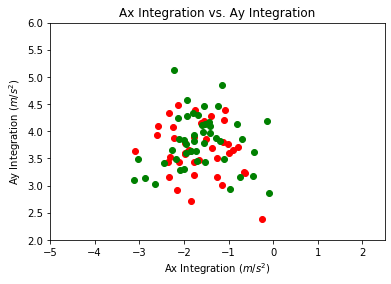

In [13]:
plt.scatter(int_x_misses, int_y_misses, c='r', marker='o')
plt.scatter(int_x_makes, int_y_makes, c='g', marker='o')
plt.axis([-5, 2.5, 2, 6])
plt.title('Ax Integration vs. Ay Integration')
plt.xlabel('Ax Integration ($m/s^2$)')
plt.ylabel('Ay Integration ($m/s^2$)')
plt.show()

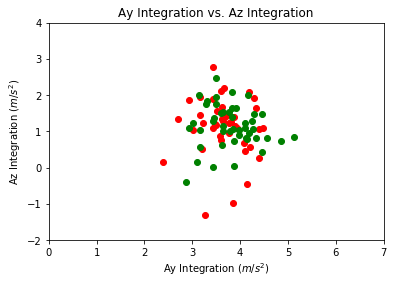

In [14]:
plt.scatter(int_y_misses, int_z_misses, c='r', marker='o')
plt.scatter(int_y_makes, int_z_makes, c='g', marker='o')
plt.axis([0, 7, -2, 4])
plt.title('Ay Integration vs. Az Integration')
plt.xlabel('Ay Integration ($m/s^2$)')
plt.ylabel('Az Integration ($m/s^2$)')
plt.show()

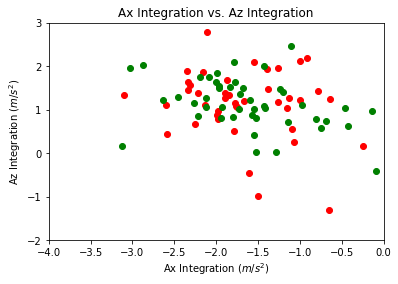

In [15]:
plt.scatter(int_x_misses, int_z_misses, c='r', marker='o')
plt.scatter(int_x_makes, int_z_makes, c='g', marker='o')
plt.axis([-4, 0, -2, 3])
plt.title('Ax Integration vs. Az Integration')
plt.xlabel('Ax Integration ($m/s^2$)')
plt.ylabel('Az Integration ($m/s^2$)')
plt.show()

<p>Looking at the max acceleration</p>

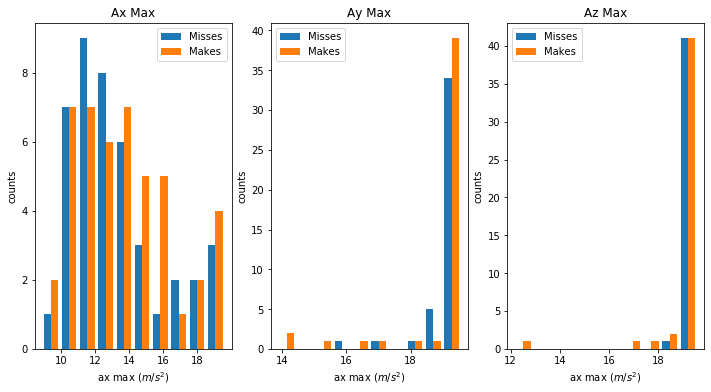

In [16]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            misses.append([9.8*data['ax'].max()/1000, 9.8*data['ay'].max()/1000
                           , 9.8*data['az'].max()/1000])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            makes.append([9.8*data['ax'].max()/1000, 9.8*data['ay'].max()/1000\
                          , 9.8*data['az'].max()/1000])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]])
ax[0].legend(('Misses', 'Makes'))
ax[0].set_title('Ax Max')
ax[0].set_xlabel('ax max ($m/s^2$)')
ax[0].set_ylabel('counts')
ax[1].hist([misses[:,1], makes[:,1]])
ax[1].legend(('Misses', 'Makes'))
ax[1].set_title('Ay Max')
ax[1].set_xlabel('ax max ($m/s^2$)')
ax[1].set_ylabel('counts')
ax[2].hist([misses[:,2], makes[:,2]])
ax[2].legend(('Misses', 'Makes'))
ax[2].set_title('Az Max')
ax[2].set_xlabel('ax max ($m/s^2$)')
ax[2].set_ylabel('counts')
plt.show()   

<p>Looking at mean values of acceleration</p>

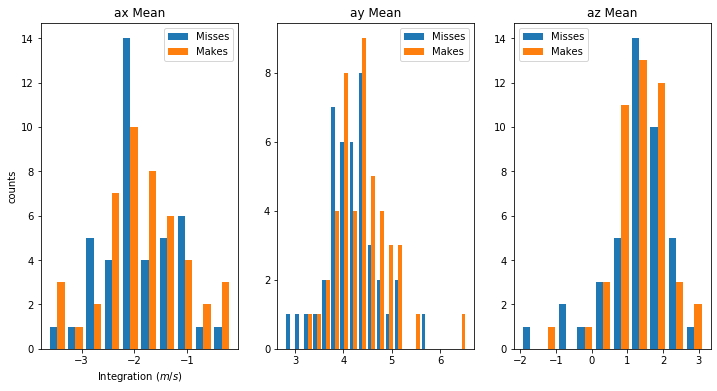

ax mean makes   mean: -1.8585309732383295 std:0.766694738321937
ax mean misses  mean: -1.9038861530128395 std:0.6601400208667966
z-statistic: 0.05915676410376672
ay mean makes   mean: 4.399393955863777 std:0.5725724136471785
ay mean misses  mean: 4.171609743200828 std:0.5337881878075472
z-statistic: 0.39782603428622537
az mean makes   mean: 1.2950766691992 std:0.7165145255475214
az mean misses  mean: 1.266592174273789 std:0.9217657223133099
z-statistic: 0.039754246298977336


In [17]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            misses.append([data['ax'].mean()*9.81/1000, data['ay'].mean()*9.81/1000,\
                           data['az'].mean()*9.81/1000])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            makes.append([data['ax'].mean()*9.81/1000, data['ay'].mean()*9.81/1000,\
                          data['az'].mean()*9.81/1000])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]])
ax[0].legend(('Misses', 'Makes'))
ax[0].set_ylabel('counts')
ax[0].set_xlabel('Integration ($m/s$)')
ax[0].set_title('ax Mean')
ax[1].hist([misses[:,1], makes[:,1]], bins=20)
ax[1].legend(('Misses', 'Makes'))
ax[0].set_ylabel('counts')
ax[0].set_xlabel('Integration ($m/s$)')
ax[1].set_title('ay Mean')
ax[2].hist([misses[:,2], makes[:,2]])
ax[2].legend(('Misses', 'Makes'))
ax[0].set_ylabel('counts')
ax[0].set_xlabel('Integration ($m/s$)')
ax[2].set_title('az Mean')
plt.show()   

print('ax mean makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('ax mean misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('ay mean makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('ay mean misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('az mean makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('az mean misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

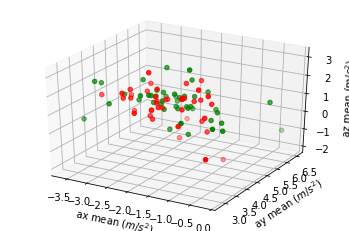

In [18]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

mean_x_misses = misses[:,0]
mean_y_misses = misses[:,1]
mean_z_misses = misses[:,2] 
ax.scatter(mean_x_misses, mean_y_misses, mean_z_misses, c='r', marker='o')

mean_x_makes = makes[:,0]
mean_y_makes = makes[:,1]
mean_z_makes = makes[:,2] 
ax.scatter(mean_x_makes, mean_y_makes, mean_z_makes, c='g', marker='o')

ax.set_xlabel('ax mean ($m/s^2$)')
ax.set_ylabel('ay mean ($m/s^2$)')
ax.set_zlabel('az mean ($m/s^2$)')

plt.show()

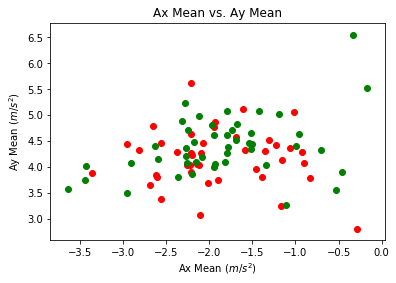

In [19]:
plt.scatter(mean_x_misses, mean_y_misses, c='r', marker='o')
plt.scatter(mean_x_makes, mean_y_makes, c='g', marker='o')
plt.title('Ax Mean vs. Ay Mean')
plt.xlabel('Ax Mean ($m/s^2$)')
plt.ylabel('Ay Mean ($m/s^2$)')
plt.show()

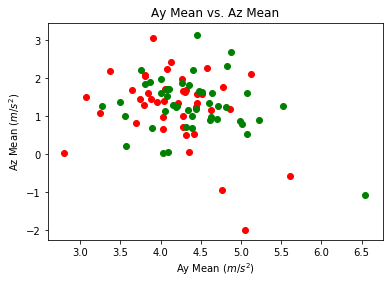

In [20]:
plt.scatter(mean_y_misses, mean_z_misses, c='r', marker='o')
plt.scatter(mean_y_makes, mean_z_makes, c='g', marker='o')
plt.title('Ay Mean vs. Az Mean')
plt.xlabel('Ay Mean ($m/s^2$)')
plt.ylabel('Az Mean ($m/s^2$)')
plt.show()

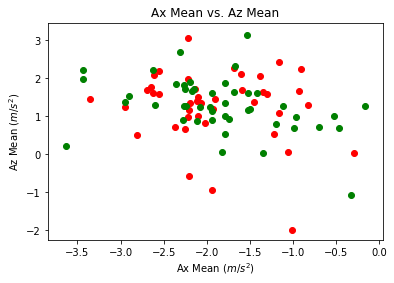

In [21]:
plt.scatter(mean_x_misses, mean_z_misses, c='r', marker='o')
plt.scatter(mean_x_makes, mean_z_makes, c='g', marker='o')
plt.title('Ax Mean vs. Az Mean')
plt.xlabel('Ax Mean ($m/s^2$)')
plt.ylabel('Az Mean ($m/s^2$)')
plt.show()

<p>Looking at the magnitude of acceleration integrated</p>

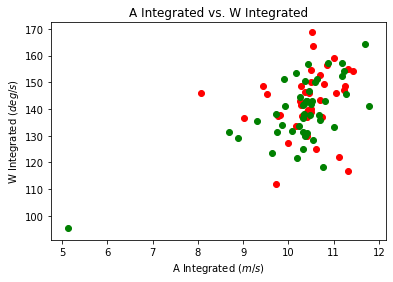

a int makes   mean: 10.278929636546724 std:0.9718859512840301
a int misses  mean: 10.418741703097567 std:0.6339594596
z-statistic: 0.14385645390400612
w int makes   mean: 139.25488999626808 std:12.155643757326255
w int misses  mean: 142.33647261582632 std:11.43912272957181
z-statistic: 0.2535104418226279


In [22]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            misses.append([simps(np.sqrt(a['ax']**2+a['ay']**2+a['az']**2)*9.8/1000, a['time']/1000),\
                          simps(np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2), w['time']/1000)])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            makes.append([simps(np.sqrt(a['ax']**2+a['ay']**2+a['az']**2)*9.8/1000, a['time']/1000),\
                          simps(np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2), w['time']/1000)])
misses = np.array(misses)
makes = np.array(makes)

plt.scatter(misses[:,0], misses[:,1], c='r', marker='o')
plt.scatter(makes[:,0], makes[:,1], c='g', marker='o')
plt.title('A Integrated vs. W Integrated')
plt.xlabel('A Integrated ($m/s$)')
plt.ylabel('W Integrated ($deg/s$)')
plt.show()

print('a int makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('a int misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('w int makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('w int misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))

<p>Looking at max angular speed</p>

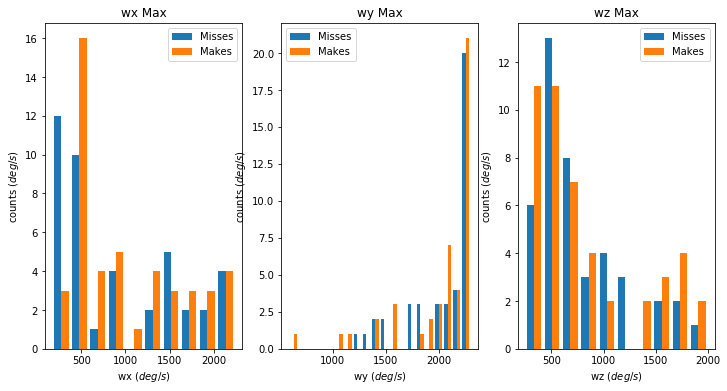

wx mean makes   mean: 1003.1456521739129 std:615.4640153739509
wx mean misses  mean: 911.092857142857 std:668.5650527143072
z-statistic: 0.14956649411115508
wy mean makes   mean: 2019.4978260869568 std:377.28009401915205
wy mean misses  mean: 2036.5571428571427 std:313.2302060350967
z-statistic: 0.04521658322455756
wz mean makes   mean: 815.9021739130435 std:511.3463173815002
wz mean misses  mean: 766.8642857142856 std:419.3092095915606
z-statistic: 0.09589956264840399


In [23]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        data, a = trim_data(w,a)
        if len(data)>10:
            misses.append([data['wx'].max(), data['wy'].max(), data['wz'].max()])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        data, a = trim_data(w,a)
        if len(data)>10:
            makes.append([data['wx'].max(), data['wy'].max(), data['wz'].max()])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]])
ax[0].legend(('Misses', 'Makes'))
ax[0].set_title('wx Max')
ax[0].set_xlabel('wx ($deg/s$)')
ax[0].set_ylabel('counts ($deg/s$)')
ax[1].hist([misses[:,1], makes[:,1]], bins=20)
ax[1].legend(('Misses', 'Makes'))
ax[1].set_title('wy Max')
ax[1].set_xlabel('wy ($deg/s$)')
ax[1].set_ylabel('counts ($deg/s$)')
ax[2].hist([misses[:,2], makes[:,2]])
ax[2].legend(('Misses', 'Makes'))
ax[2].set_title('wz Max')
ax[2].set_xlabel('wz ($deg/s$)')
ax[2].set_ylabel('counts ($deg/s$)')
plt.show() 


print('wx mean makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('wx mean misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('wy mean makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('wy mean misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('wz mean makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('wz mean misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

<p>Looking at frequences from fft</p>

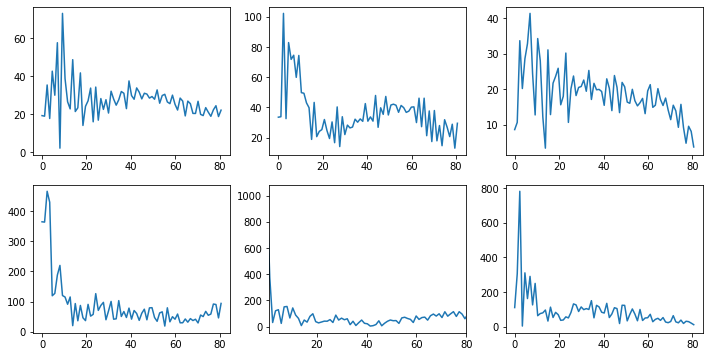

In [24]:
a = pd.read_csv(dir+'FreeThrows_7_31/'+files[-2])
w = pd.read_csv(dir+'FreeThrows_7_31/'+files[-1])

w, a = trim_data(w, a)

fig, ax = plt.subplots(2,3, figsize=(12,6))

N = len(w['time'])
T = (w['time'][N-1]-w['time'][0])/N/1000
t = np.linspace(0.0, N*T, N)
uniform_wx= resample(w['wx'], N, w['time']/1000)
fft_wx = fft(uniform_wx[0])
t_f = np.linspace(0.0, 1.0/2/T, N//2)
ax[0,0].plot(t_f, 2/N*np.abs(fft_wx[0:N//2]))

uniform_wy= resample(w['wy'], N, w['time']/1000)
fft_wy = fft(uniform_wy[0])
ax[0,1].plot(t_f, 2/N*np.abs(fft_wy[0:N//2]))

uniform_wz= resample(w['wz'], N, w['time']/1000)
fft_wz = fft(uniform_wz[0])
ax[0,2].plot(t_f, 2/N*np.abs(fft_wz[0:N//2]))

N = len(a['time'])
T = (a['time'][N-1]-a['time'][0])/N/1000
t = np.linspace(0.0, N*T, N)
uniform_ax= resample(a['ax'], N, a['time']/1000)
fft_ax = fft(uniform_ax[0])
ax[1,0].plot(t_f, 2/N*np.abs(fft_ax[0:N//2]))

uniform_ay= resample(a['ay'], N, a['time']/1000)
fft_ay = fft(uniform_ay[0])
ax[1,1].plot(t_f, 2/N*np.abs(fft_ay[0:N//2]))
ax[1,1].set_xlim([1, 80])

uniform_az= resample(a['az'], N, a['time']/1000)
fft_az = fft(uniform_az[0])
ax[1,2].plot(t_f, 2/N*np.abs(fft_az[0:N//2]))

plt.show()



In [25]:
w = pd.read_csv(dir+'FreeThrows_7_31/'+files[5])
a = pd.read_csv(dir+'FreeThrows_7_31/'+files[4])
w, a = trim_data(w,a)

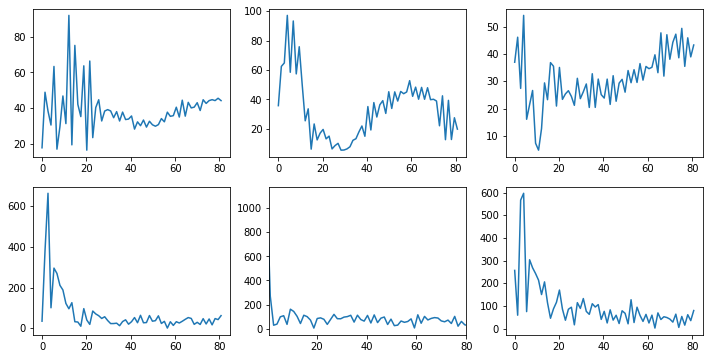

In [26]:
fig, ax = plt.subplots(2,3, figsize=(12,6))

N = len(w['time'])
T = (w['time'][N-1]-w['time'][0])/N/1000
t = np.linspace(0.0, N*T, N)
uniform_wx= resample(w['wx'], N, w['time']/1000)
fft_wx = fft(uniform_wx[0])
f = np.linspace(0.0, 1.0/2/T, N//2)
ax[0,0].plot(f, 2/N*np.abs(fft_wx[0:N//2]))

uniform_wy= resample(w['wy'], N, w['time']/1000)
fft_wy = fft(uniform_wy[0])
ax[0,1].plot(f, 2/N*np.abs(fft_wy[0:N//2]))

uniform_wz= resample(w['wz'], N, w['time']/1000)
fft_wz = fft(uniform_wz[0])
ax[0,2].plot(f, 2/N*np.abs(fft_wz[0:N//2]))

N = len(a['time'])
T = (a['time'][N-1]-a['time'][0])/N/1000
t = np.linspace(0.0, N*T, N)
uniform_ax= resample(a['ax'], N, a['time']/1000)
fft_ax = fft(uniform_ax[0])
ax[1,0].plot(f, 2/N*np.abs(fft_ax[0:N//2]))

uniform_ay= resample(a['ay'], N, a['time']/1000)
fft_ay = fft(uniform_ay[0])
ax[1,1].plot(f, 2/N*np.abs(fft_ay[0:N//2]))
ax[1,1].set_xlim([1, 80])

uniform_az= resample(a['az'], N, a['time']/1000)
fft_az = fft(uniform_az[0])
ax[1,2].plot(f, 2/N*np.abs(fft_az[0:N//2]))

plt.show()

<p>Looking at acceleration frequencies</p>

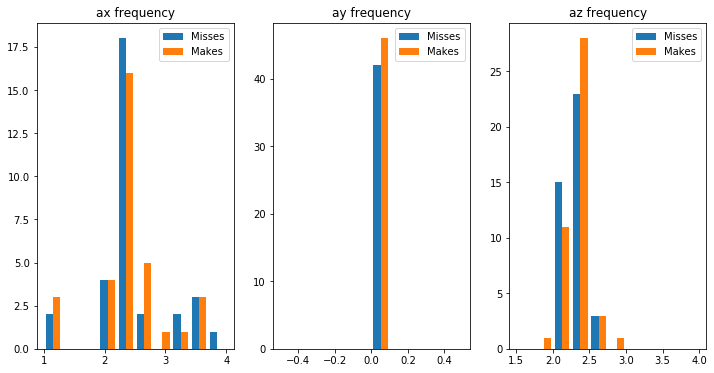

fx mean makes   mean: 1.6989045012582549 std:1.1569474158273945
fx mean misses  mean: 1.86939876218674 std:1.1628027628421886
z-statistic: 0.14736560935792895
fy mean makes   mean: 0.0 std:0.0
fy mean misses  mean: 0.0 std:0.0
fz mean makes   mean: 2.2950852277201856 std:0.446995425733001
fz mean misses  mean: 2.358827422389952 std:0.39612305361972794
z-statistic: 0.14260144735315688


In [27]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            N = len(data['time'])
            T = (data['time'][N-1]-data['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_ax= resample(data['ax'], N, data['time'])
            fft_ax = fft(uniform_ax[0])
            uniform_ay = resample(data['ay'], N, data['time'])
            fft_ay = fft(uniform_ay[0])
            uniform_az = resample(data['az'], N, data['time'])
            fft_az = fft(uniform_az[0])
            axfs = 2/N*np.abs(fft_ax[0:N//2])
            axf = f[np.where(axfs==axfs.max())[0][0]] 
            ayfs = 2/N*np.abs(fft_ay[0:N//2])
            ayf = f[np.where(ayfs==ayfs.max())[0][0]] 
            azfs = 2/N*np.abs(fft_az[0:N//2])
            azf = f[np.where(azfs==azfs.max())[0][0]] 
            misses.append([axf, ayf, azf])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'a' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('a.')[0]+'w.csv')
        w, data = trim_data(w,a)
        if len(data)>10:
            N = len(data['time'])
            T = (data['time'][N-1]-data['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_ax= resample(data['ax'], N, data['time'])
            fft_ax = fft(uniform_ax[0])
            uniform_ay = resample(data['ay'], N, data['time'])
            fft_ay = fft(uniform_ay[0])
            uniform_az = resample(data['az'], N, data['time'])
            fft_az = fft(uniform_az[0])
            axfs = 2/N*np.abs(fft_ax[0:N//2])
            axf = f[np.where(axfs==axfs.max())[0][0]] 
            ayfs = 2/N*np.abs(fft_ay[0:N//2])
            ayf = f[np.where(ayfs==ayfs.max())[0][0]] 
            azfs = 2/N*np.abs(fft_az[0:N//2])
            azf = f[np.where(azfs==azfs.max())[0][0]] 
            makes.append([axf, ayf, azf])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]], range=(1,4))
ax[0].legend(('Misses', 'Makes'))
ax[0].set_title('ax frequency')
ax[1].hist([misses[:,1], makes[:,1]])
ax[1].legend(('Misses', 'Makes'))
ax[1].set_title('ay frequency')
ax[2].hist([misses[:,2], makes[:,2]], range=(1.5,4))
ax[2].legend(('Misses', 'Makes'))
ax[2].set_title('az frequency')
plt.show()      

print('fx mean makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('fx mean misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('fy mean makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('fy mean misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
#print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('fz mean makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('fz mean misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

In [28]:
feq_x_misses = misses[:,0]
feq_y_misses = misses[:,1]
feq_z_misses = misses[:,2] 

feq_x_makes = makes[:,0]
feq_y_makes = makes[:,1]
feq_z_makes = makes[:,2] 

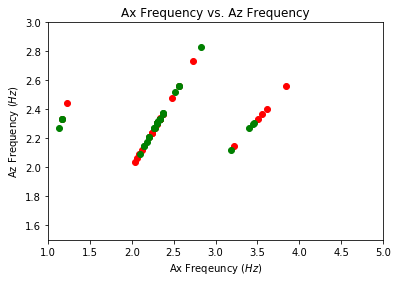

In [29]:
plt.scatter(feq_x_misses, feq_z_misses, c='r', marker='o')
plt.scatter(feq_x_makes, feq_z_makes, c='g', marker='o')
plt.axis([1, 5, 1.5, 3])
plt.title('Ax Frequency vs. Az Frequency')
plt.xlabel('Ax Freqeuncy ($Hz$)')
plt.ylabel('Az Frequency ($Hz$)')
plt.show()

<p>Looking at angular speed frequencies</p>

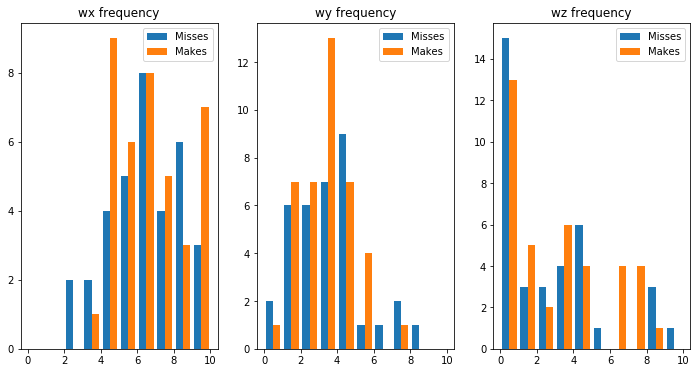

fx makes   mean: 9.058396114133066 std:7.389752659928198
fx misses  mean: 10.938003080528956 std:11.251951572281365
z-statistic: 0.25435316348113785
fy makes   mean: 10.232028773041636 std:16.263117571517427
fy misses  mean: 11.535899539355352 std:17.354272912668762
z-statistic: 0.08017348214940433
fz makes   mean: 6.264061676071675 std:9.41112843411277
fz misses  mean: 7.203970053578496 std:12.735123383928503
z-statistic: 0.09987201684549434


In [30]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in miss_files:
        data = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        if data.diff()['time'].max()<300 and len(data)>150:
            N = len(data['time'])
            T = (data['time'][N-1]-data['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_wx= resample(data['wx'], N, data['time'])
            fft_wx = fft(uniform_wx[0])
            uniform_wy = resample(data['wy'], N, data['time'])
            fft_wy = fft(uniform_wy[0])
            uniform_wz = resample(data['wz'], N, data['time'])
            fft_wz = fft(uniform_wz[0])
            wxfs = 2/N*np.abs(fft_wx[0:N//2])
            wxf = f[np.where(wxfs==wxfs.max())[0][0]] 
            wyfs = 2/N*np.abs(fft_wy[0:N//2])
            wyf = f[np.where(wyfs==wyfs.max())[0][0]] 
            wzfs = 2/N*np.abs(fft_wz[0:N//2])
            wzf = f[np.where(wzfs==wzfs.max())[0][0]] 
            misses.append([wxf, wyf, wzf])
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in made_files:
        data = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        if data.diff()['time'].max()<300 and len(data)>150:
            data = pd.read_csv(dir+'FreeThrows_7_31/'+file)
            N = len(data['time'])
            T = (data['time'][N-1]-data['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_wx= resample(data['wx'], N, data['time'])
            fft_wx = fft(uniform_wx[0])
            uniform_wy = resample(data['wy'], N, data['time'])
            fft_wy = fft(uniform_wy[0])
            uniform_wz = resample(data['wz'], N, data['time'])
            fft_wz = fft(uniform_wz[0])
            wxfs = 2/N*np.abs(fft_wx[0:N//2])
            wxf = f[np.where(wxfs==wxfs.max())[0][0]] 
            wyfs = 2/N*np.abs(fft_wy[0:N//2])
            wyf = f[np.where(wyfs==wyfs.max())[0][0]] 
            wzfs = 2/N*np.abs(fft_wz[0:N//2])
            wzf = f[np.where(wzfs==wzfs.max())[0][0]] 
            makes.append([wxf, wyf, wzf])
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]], range=(0,10))
ax[0].legend(('Misses', 'Makes'))
ax[0].set_title('wx frequency')
ax[1].hist([misses[:,1], makes[:,1]], range=(0,10))
ax[1].legend(('Misses', 'Makes'))
ax[1].set_title('wy frequency')
ax[2].hist([misses[:,2], makes[:,2]], range=(0,10))
ax[2].legend(('Misses', 'Makes'))
ax[2].set_title('wz frequency')
plt.show() 

print('fx makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('fx misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('fy makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('fy misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('fz makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('fz misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

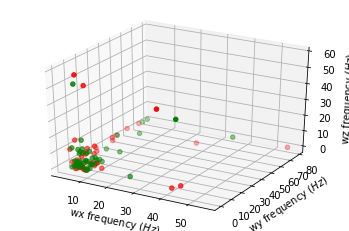

In [31]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

frq_wx_misses = misses[:,0]
frq_wy_misses = misses[:,1]
frq_wz_misses = misses[:,2] 
ax.scatter(frq_wx_misses, frq_wy_misses, frq_wz_misses, c='r', marker='o')

frq_wx_makes = makes[:,0]
frq_wy_makes = makes[:,1]
frq_wz_makes = makes[:,2] 
ax.scatter(frq_wx_makes, frq_wy_makes, frq_wz_makes, c='g', marker='o')

ax.set_xlabel('wx frequency ($Hz$)')
ax.set_ylabel('wy frequency ($Hz$)')
ax.set_zlabel('wz frequency ($Hz$)')

plt.show()

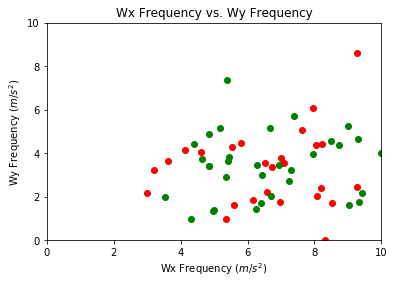

In [32]:
plt.scatter(frq_wx_misses, frq_wy_misses, c='r', marker='o')
plt.scatter(frq_wx_makes, frq_wy_makes, c='g', marker='o')
plt.axis([0, 10, 0, 10])
plt.title('Wx Frequency vs. Wy Frequency')
plt.xlabel('Wx Frequency ($m/s^2$)')
plt.ylabel('Wy Frequency ($m/s^2$)')
plt.show()

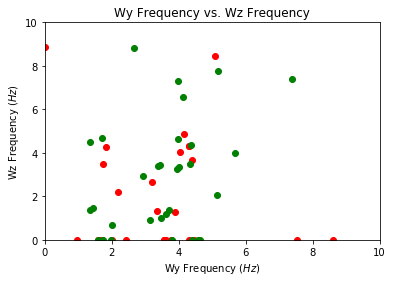

In [33]:
plt.scatter(frq_wy_misses, frq_wz_misses, c='r', marker='o')
plt.scatter(frq_wy_makes, frq_wz_makes, c='g', marker='o')
plt.axis([0, 10, 0, 10])
plt.title('Wy Frequency vs. Wz Frequency')
plt.xlabel('Wy Frequency ($Hz$)')
plt.ylabel('Wz Frequency ($Hz$)')
plt.show()

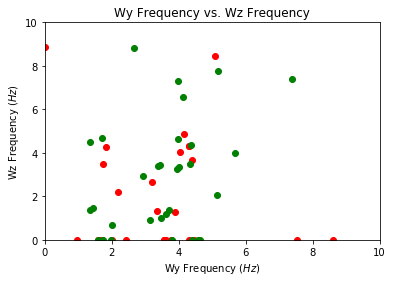

In [34]:
plt.scatter(frq_wy_misses, frq_wz_misses, c='r', marker='o')
plt.scatter(frq_wy_makes, frq_wz_makes, c='g', marker='o')
plt.axis([0, 10, 0, 10])
plt.title('Wy Frequency vs. Wz Frequency')
plt.xlabel('Wy Frequency ($Hz$)')
plt.ylabel('Wz Frequency ($Hz$)')
plt.show()

<p>Looking at v calculated from integration</p>

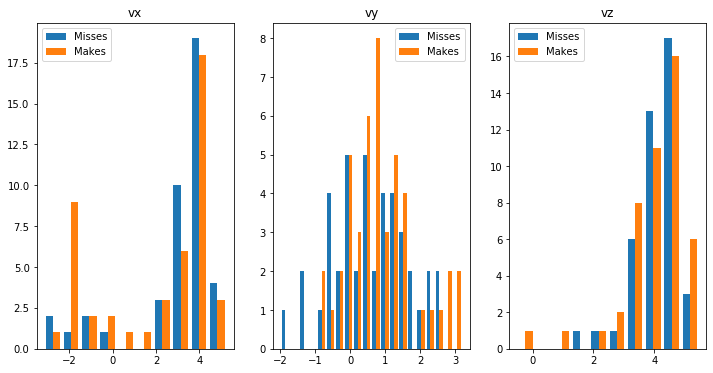

vx mean makes   mean: 2.05747698948555 std:2.600457523062679
vx mean misses  mean: 2.9588958996201478 std:2.015133126638498
z-statistic: 0.3466385826879246
vy mean makes   mean: 0.8723835612929121 std:0.9609202914046043
vy mean misses  mean: 0.5770380318821776 std:1.0513250861351389
z-statistic: 0.3073569494291972
vz mean makes   mean: 3.991400481874979 std:1.0891261537377028
vz mean misses  mean: 4.10513906760549 std:0.7450829235078251
z-statistic: 0.10443104808398834


In [35]:
misses = []
makes = []

md_miss = md[md['make']==0]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            misses.append(list(get_v(w,a)))
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            makes.append(list(get_v(w,a)))
makes = np.array(makes)

fig, ax = plt.subplots(1,3, figsize=(12,6))
ax[0].hist([misses[:,0], makes[:,0]])
ax[0].legend(('Misses', 'Makes'))
ax[0].set_title('vx')
ax[1].hist([misses[:,1], makes[:,1]], bins=20)
ax[1].legend(('Misses', 'Makes'))
ax[1].set_title('vy')
ax[2].hist([misses[:,2], makes[:,2]])
ax[2].legend(('Misses', 'Makes'))
ax[2].set_title('vz')

plt.show()

print('vx mean makes   mean: '+str(makes[:,0].mean())+' std:'+str(makes[:,0].std()))
print('vx mean misses  mean: '+str(misses[:,0].mean())+' std:'+str(misses[:,0].std()))
print('z-statistic: '+str(abs(makes[:,0].mean()-misses[:,0].mean())/(makes[:,0].std())))
print('vy mean makes   mean: '+str(makes[:,1].mean())+' std:'+str(makes[:,1].std()))
print('vy mean misses  mean: '+str(misses[:,1].mean())+' std:'+str(misses[:,1].std()))
print('z-statistic: '+str(abs(makes[:,1].mean()-misses[:,1].mean())/(makes[:,1].std())))
print('vz mean makes   mean: '+str(makes[:,2].mean())+' std:'+str(makes[:,2].std()))
print('vz mean misses  mean: '+str(misses[:,2].mean())+' std:'+str(misses[:,2].std()))
print('z-statistic: '+str(abs(makes[:,2].mean()-misses[:,2].mean())/(makes[:,2].std())))

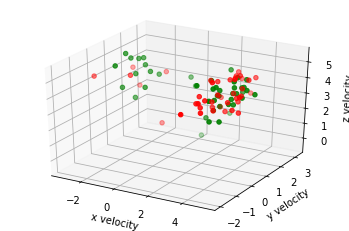

In [36]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

vx_misses = misses[:,0]
vy_misses = misses[:,1]
vz_misses = misses[:,2] 
ax.scatter(vx_misses, vy_misses, vz_misses, c='r', marker='o')

vx_makes = makes[:,0]
vy_makes = makes[:,1]
vz_makes = makes[:,2] 
ax.scatter(vx_makes, vy_makes, vz_makes, c='g', marker='o')

ax.set_xlabel('x velocity')
ax.set_ylabel('y velocity')
ax.set_zlabel('z velocity')

plt.show()

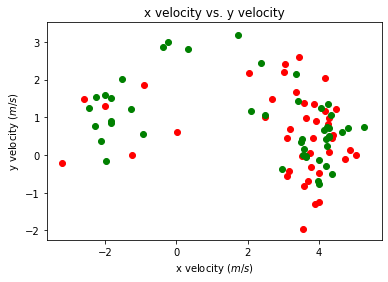

In [37]:
plt.scatter(vx_misses, vy_misses, c='r', marker='o')
plt.scatter(vx_makes, vy_makes, c='g', marker='o')
plt.title('x velocity vs. y velocity')
plt.xlabel('x velocity ($m/s$)')
plt.ylabel('y velocity ($m/s$)')
plt.show()

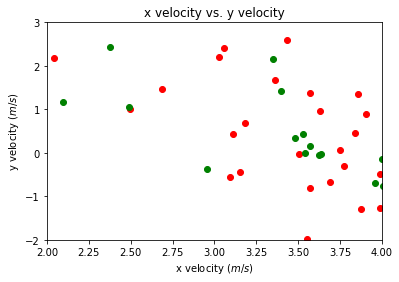

In [38]:
plt.scatter(vx_misses, vy_misses, c='r', marker='o')
plt.scatter(vx_makes, vy_makes, c='g', marker='o')
plt.axis([2, 4, -2, 3])
plt.title('x velocity vs. y velocity')
plt.xlabel('x velocity ($m/s$)')
plt.ylabel('y velocity ($m/s$)')
plt.show()

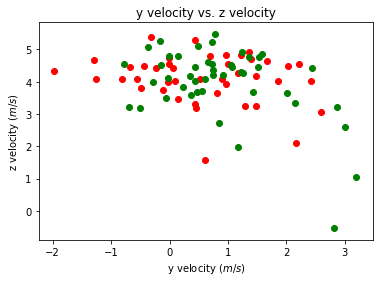

In [39]:
plt.scatter(vy_misses, vz_misses, c='r', marker='o')
plt.scatter(vy_makes, vz_makes, c='g', marker='o')
plt.title('y velocity vs. z velocity')
plt.xlabel('y velocity ($m/s$)')
plt.ylabel('z velocity ($m/s$)')
plt.show()

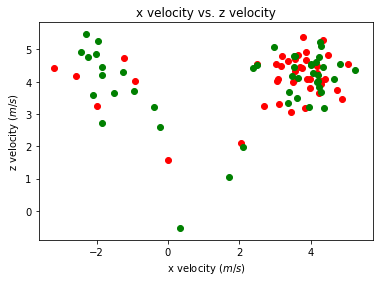

In [40]:
plt.scatter(vx_misses, vz_misses, c='r', marker='o')
plt.scatter(vx_makes, vz_makes, c='g', marker='o')
plt.title('x velocity vs. z velocity')
plt.xlabel('x velocity ($m/s$)')
plt.ylabel('z velocity ($m/s$)')
plt.show()

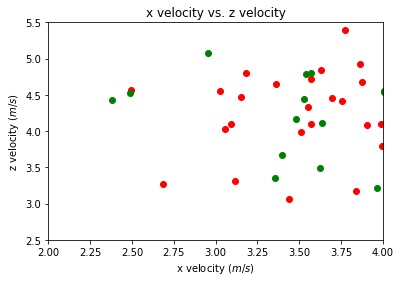

In [41]:
plt.scatter(vx_misses, vz_misses, c='r', marker='o')
plt.scatter(vx_makes, vz_makes, c='g', marker='o')
plt.title('x velocity vs. z velocity')
plt.axis([2,4,2.5,5.5])
plt.xlabel('x velocity ($m/s$)')
plt.ylabel('z velocity ($m/s$)')
plt.show()

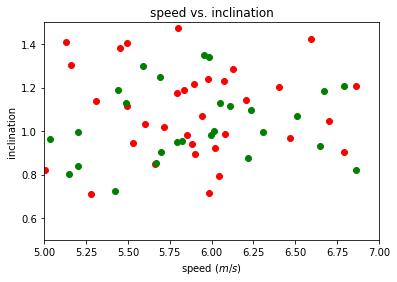

In [42]:
plt.scatter(np.sqrt(vx_misses**2+vy_misses**2+vz_misses**2),
            vz_misses/np.sqrt(vx_misses**2+vy_misses**2), c='r', marker='o')
plt.scatter(np.sqrt(vx_makes**2+vy_makes**2+vz_makes**2),
            vz_makes/np.sqrt(vx_makes**2+vy_makes**2), c='g', marker='o')
plt.axis([5,7,0.5,1.5])
plt.title('speed vs. inclination')
plt.xlabel('speed ($m/s$)')
plt.ylabel('inclination')
plt.show()

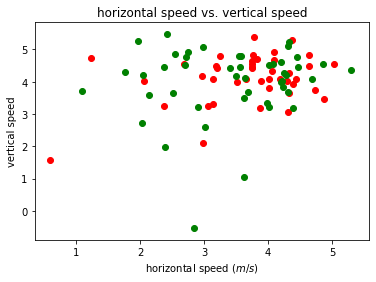

In [43]:
plt.scatter(np.sqrt(vx_misses**2+vy_misses**2), vz_misses, c='r', marker='o')
plt.scatter(np.sqrt(vx_makes**2+vy_makes**2),vz_makes, c='g', marker='o')
#plt.axis([5,7,0.5,1.5])
plt.title('horizontal speed vs. vertical speed')
plt.xlabel('horizontal speed ($m/s$)')
plt.ylabel('vertical speed')
plt.show()

<p>No left or right</p>

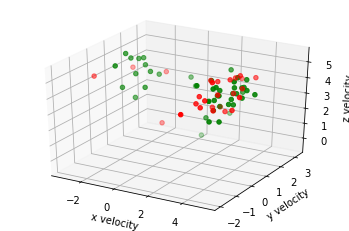

In [44]:
misses = []
makes = []

md_miss = md[md['make']==0]
md_miss = md_miss[md_miss['left']!=1]
md_miss = md_miss[md_miss['right']!=1]
miss_files = md_miss['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in miss_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            misses.append(list(get_v(w,a)))
misses = np.array(misses)

md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

for file in tqdm(files):
    if 'w' in file and file.split('.')[0][:-1] in made_files:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w,a)
        if len(w)>10:
            makes.append(list(get_v(w,a)))
makes = np.array(makes)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

vxnlr_misses = misses[:,0]
vynlr_misses = misses[:,1]
vznlr_misses = misses[:,2] 
ax.scatter(vxnlr_misses, vynlr_misses, vznlr_misses, c='r', marker='o')

vxnlr_makes = makes[:,0]
vynlr_makes = makes[:,1]
vznlr_makes = makes[:,2] 
ax.scatter(vxnlr_makes, vynlr_makes, vznlr_makes, c='g', marker='o')

ax.set_xlabel('x velocity')
ax.set_ylabel('y velocity')
ax.set_zlabel('z velocity')

plt.show()

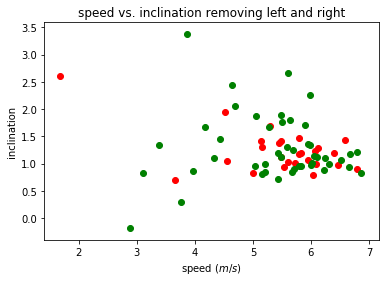

In [45]:
plt.scatter(np.sqrt(vxnlr_misses**2+vynlr_misses**2+vznlr_misses**2),
            vznlr_misses/np.sqrt(vxnlr_misses**2+vynlr_misses**2), c='r', marker='o')
plt.scatter(np.sqrt(vxnlr_makes**2+vynlr_makes**2+vznlr_makes**2),
            vznlr_makes/np.sqrt(vxnlr_makes**2+vynlr_makes**2), c='g', marker='o')
#plt.axis([5,7,0.5,1.5])
plt.title('speed vs. inclination removing left and right')
plt.xlabel('speed ($m/s$)')
plt.ylabel('inclination')
plt.show()

<p>Logistic Regression</p>

In [46]:
files = os.listdir(dir+'FreeThrows_7_31')
md = pd.read_csv(dir+'motion_data.csv')
md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

df = pd.DataFrame([], columns=['ax_int', 'ay_int', 'az_int', 'speed', 'inclination', 'make'])


for file in tqdm(files):
    if 'w' in file:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w, a)
        if len(w)>10:
            v = get_v(w,a)
            ax_int = v[0]
            ay_int = v[1]
            az_int = v[2]
            speed = np.sqrt(v[0]**2 + v[1]**2 + v[2]**2)
            inclination = np.sqrt(v[0]**2+v[1]**2)/v[2]
            if file.split('w')[0] in made_files:
                make = 1
            else:
                make = 0
            df.loc[len(df)] = [ax_int, ay_int, az_int, speed, inclination, make]

X = df.drop('make', axis=1)
y = df['make']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
log_reg = LogisticRegression(solver='lbfgs')
log_reg.fit(X_train, y_train)
score = log_reg.score(X_test, y_test)
print(score)


0.2962962962962963


In [80]:
files = os.listdir(dir+'FreeThrows_7_31')
md = pd.read_csv(dir+'motion_data.csv')
md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

df = pd.DataFrame([], columns=['ay_int', 'ay_mean', 'w_int', 'wxf', 'vx', 'vy', 'make'])


for file in tqdm(files):
    if 'w' in file:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w, a)
        if len(w)>10:
            ay_int = simps(a['ay'],a['time'])
            ay_mean = a['ay'].mean()
            w_int = simps(np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2),w['time'])
            v = get_v(w,a)
            vx = v[0]
            vy = v[1]
            N = len(w['time'])
            T = (w['time'][N-1]-w['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_wx= resample(w['wx'], N, w['time'])
            fft_wx = fft(uniform_wx[0])
            wxfs = 2/N*np.abs(fft_wx[0:N//2])
            wxf = f[np.where(wxfs==wxfs.max())[0][0]] 
            if file.split('w')[0] in made_files:
                make = 1
            else:
                make = 0
            df.loc[len(df)] = [ay_int, ay_mean, w_int, wxf, vx, vy, make]

X = df.drop('make', axis=1)
y = df['make']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
log_reg = LogisticRegression(solver='lbfgs')
log_reg.fit(X_train, y_train)
score = log_reg.score(X_test, y_test)
print('Logrithmic Regression score: ',score)


Logrithmic Regression score:  0.6296296296296297


In [85]:
files = os.listdir(dir+'FreeThrows_7_31')
md = pd.read_csv(dir+'motion_data.csv')
md_made = md[md['make']==1]
made_files = md_made['file_name'].to_string()

df = pd.DataFrame([], columns=['ay_int', 'ay_mean', 'w_int', 'wxf', 'vx', 'vy', 'make'])


for file in tqdm(files):
    if 'w' in file:
        a = pd.read_csv(dir+'FreeThrows_7_31/'+file.split('w.')[0]+'a.csv')
        w = pd.read_csv(dir+'FreeThrows_7_31/'+file)
        w, a = trim_data(w, a)
        if len(w)>10:
            ay_int = simps(a['ay'],a['time'])
            ay_mean = a['ay'].mean()
            w_int = simps(np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2),w['time'])
            v = get_v(w,a)
            vx = v[0]
            vy = v[1]
            N = len(w['time'])
            T = (w['time'][N-1]-w['time'][0])/N/1000
            t = np.linspace(0.0, N*T, N)
            f = np.linspace(0.0, 1.0/2/T, N//2)
            uniform_wx= resample(w['wx'], N, w['time'])
            fft_wx = fft(uniform_wx[0])
            wxfs = 2/N*np.abs(fft_wx[0:N//2])
            wxf = f[np.where(wxfs==wxfs.max())[0][0]] 
            if file.split('w')[0] in made_files:
                make = 1
            else:
                make = 0
            df.loc[len(df)] = [ay_int, ay_mean, w_int, wxf, vx, vy, make]

X = df.drop('make', axis=1)
y = df['make']
random_forest = RandomForestRegressor(n_estimators = 1000)
random_forest.fit(X_train, y_train)
predictions = random_forest.predict(X_test)
score = sum(abs(np.round(predictions)-y_test)/len(y_test))
print('Random Forrest score: ', score)


Random Forrest score:  0.4074074074074074


<h1>Appendix</h1>

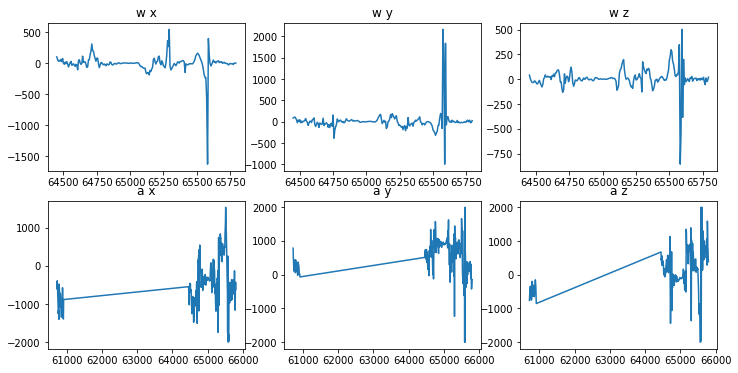

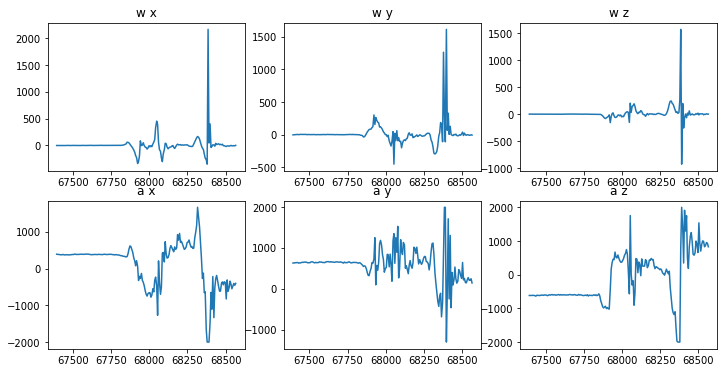

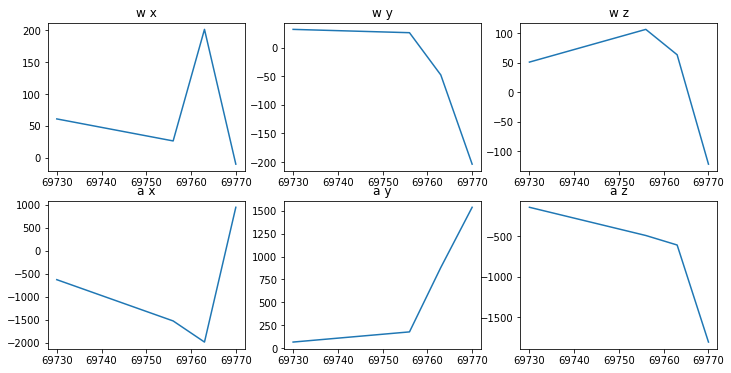

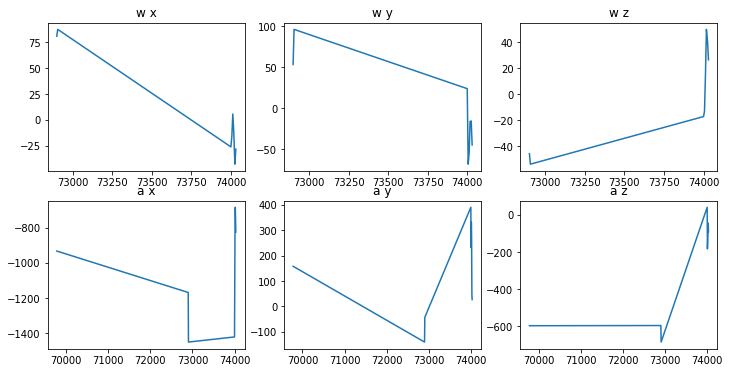

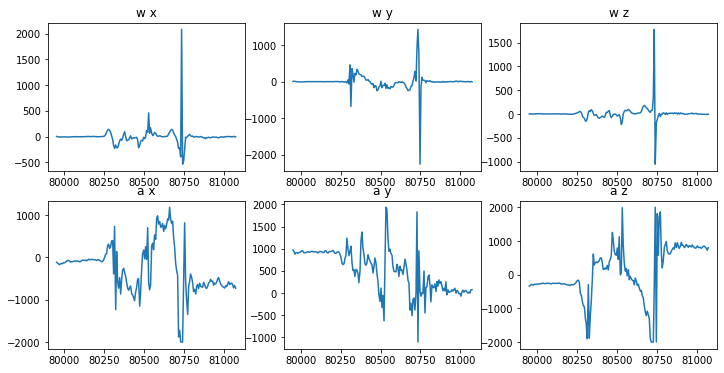

...

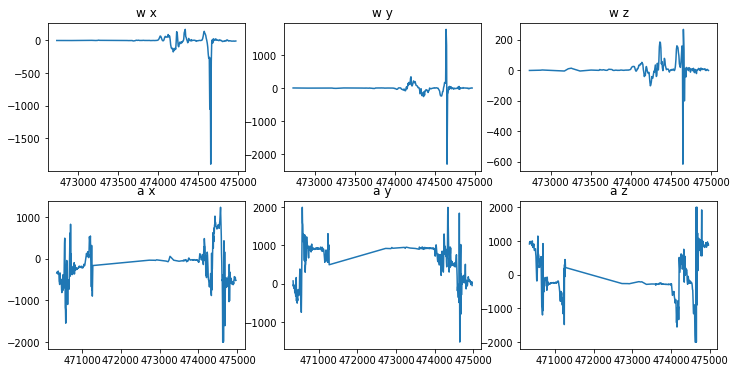

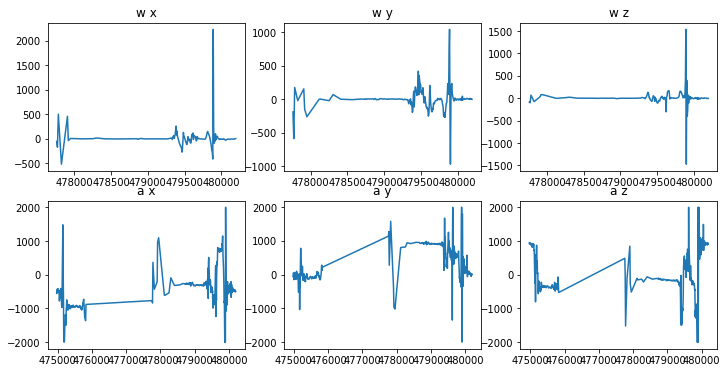

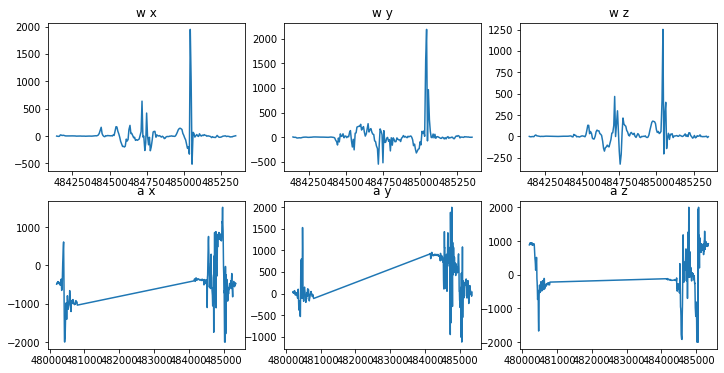

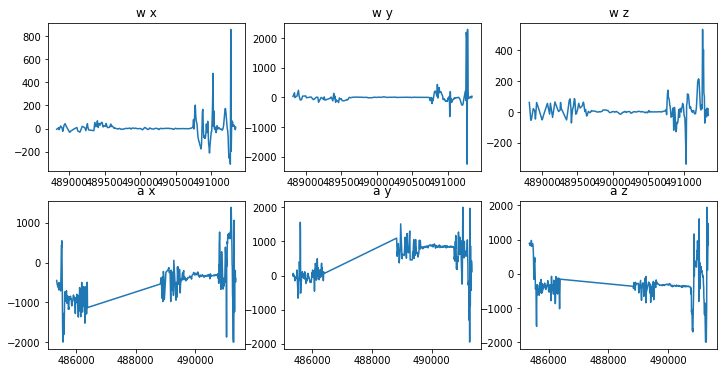

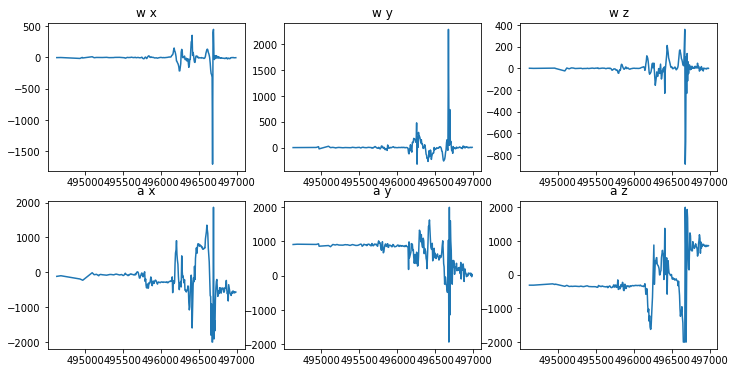

In [48]:
for n in range(1,100):
    a = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n])
    w = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n+1])
    fig, ax = plt.subplots(2,3, figsize=(12,6))

    ax[0, 0].set_title('w x')
    ax[0, 0].plot(w['time'], w['wx'])

    ax[0, 1].set_title('w y')
    ax[0, 1].plot(w['time'], w['wy'])

    ax[0, 2].set_title('w z')
    ax[0, 2].plot(w['time'], w['wz'])

    ax[1, 0].set_title('a x')
    ax[1, 0].plot(a['time'], a['ax'])

    ax[1, 1].set_title('a y')
    ax[1, 1].plot(a['time'], a['ay'])

    ax[1, 2].set_title('a z')
    ax[1, 2].plot(a['time'], a['az'])

    plt.show()

<p><b>Examing all signals after trimming</b></p>

Made Shot:


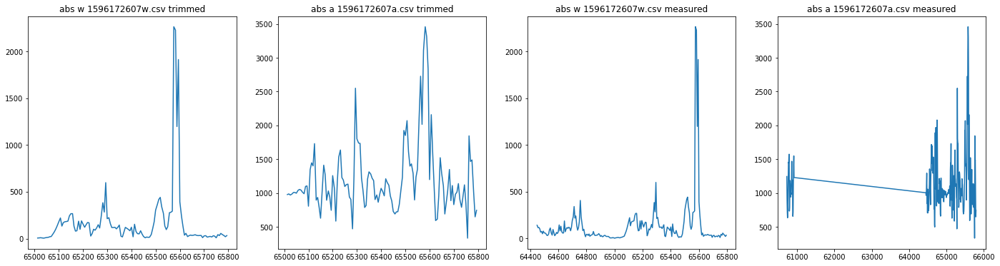



Made Shot:


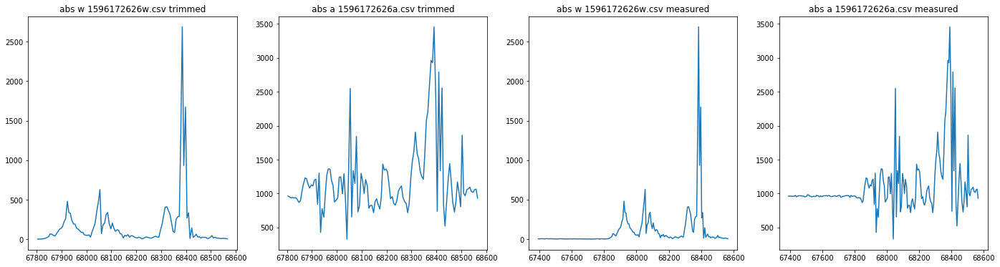



Made Shot:


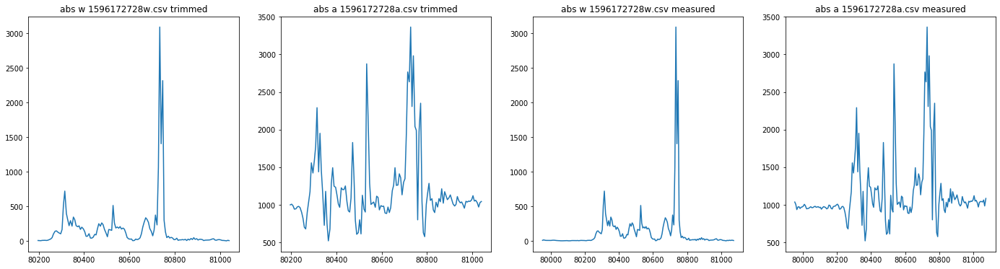



Made Shot:


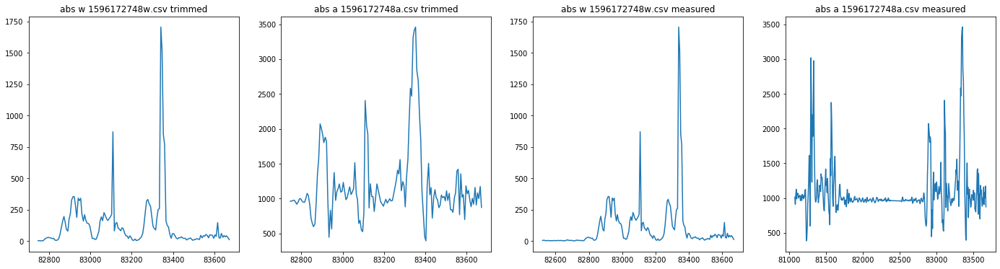



Made Shot:


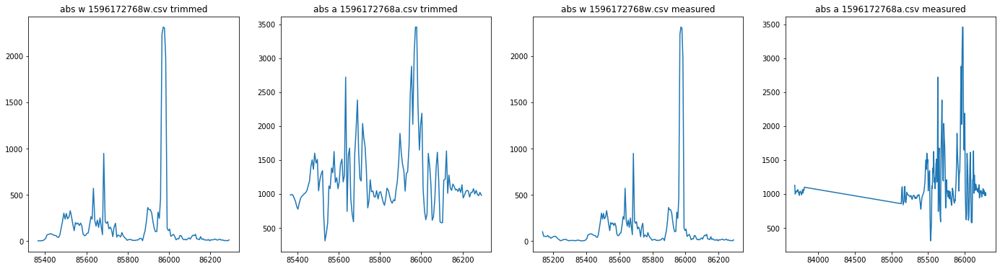



Made Shot:


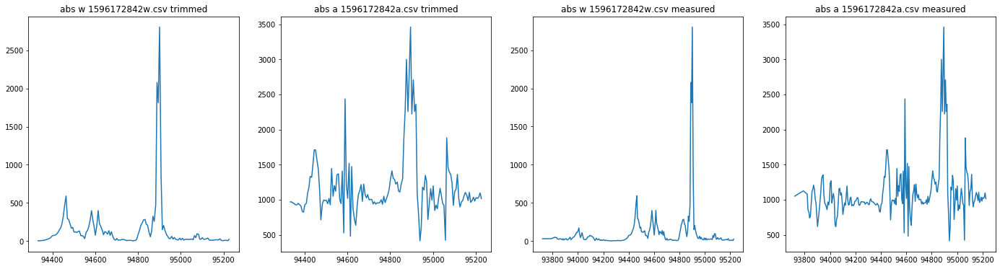



Missed Shot:


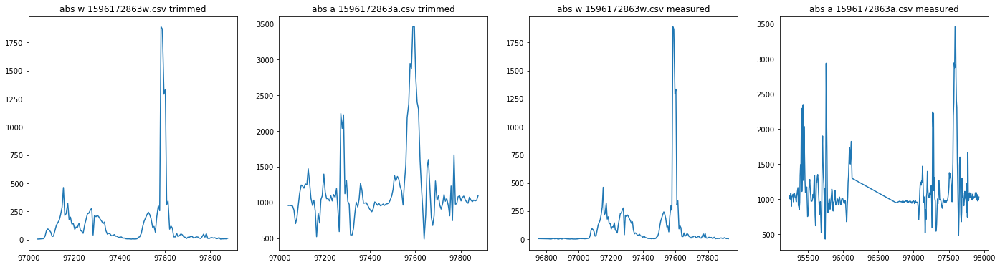



Missed Shot:


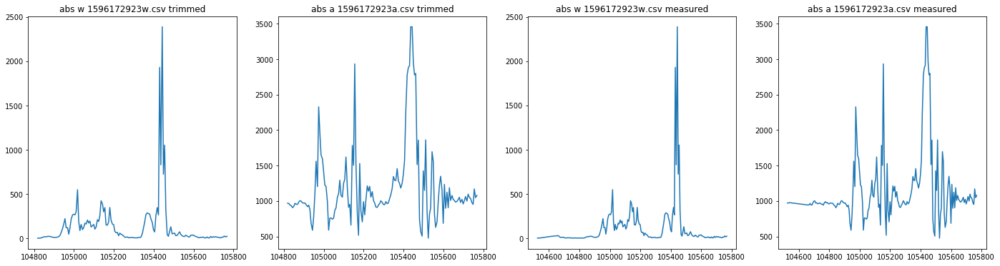



Made Shot:


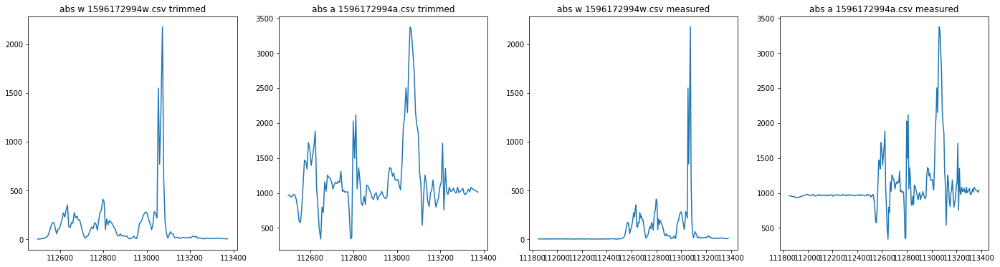



Missed Shot:


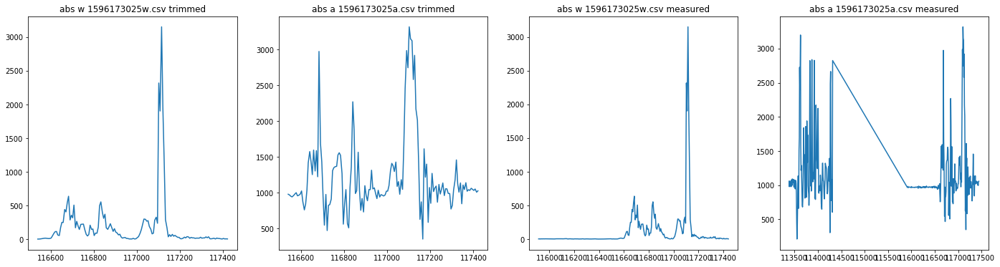



Made Shot:


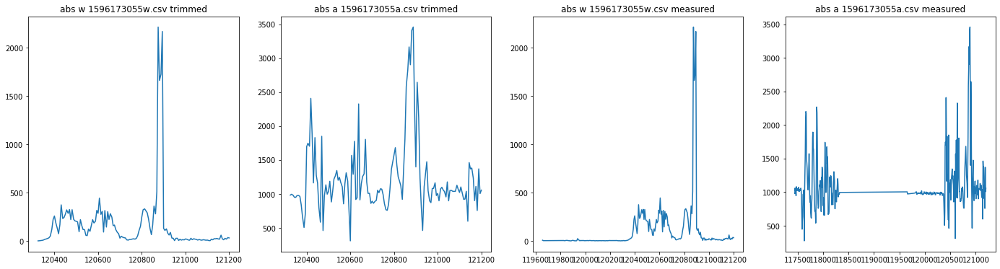



Made Shot:


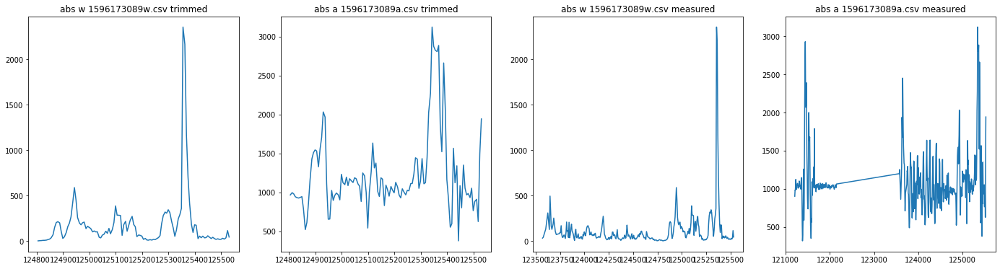



Made Shot:


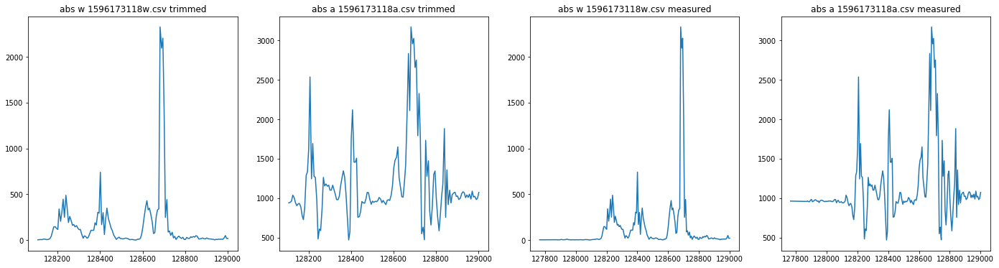



Made Shot:


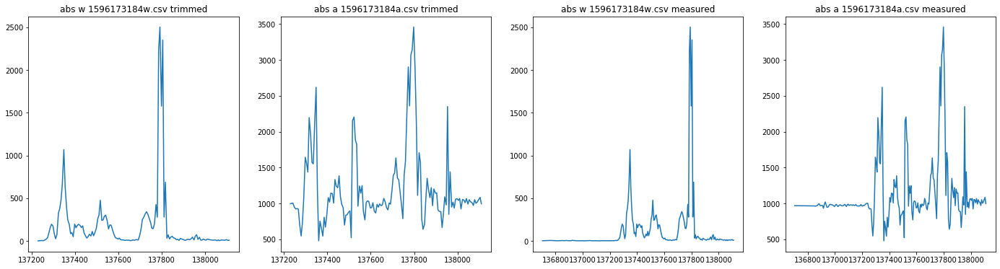



Missed Shot:


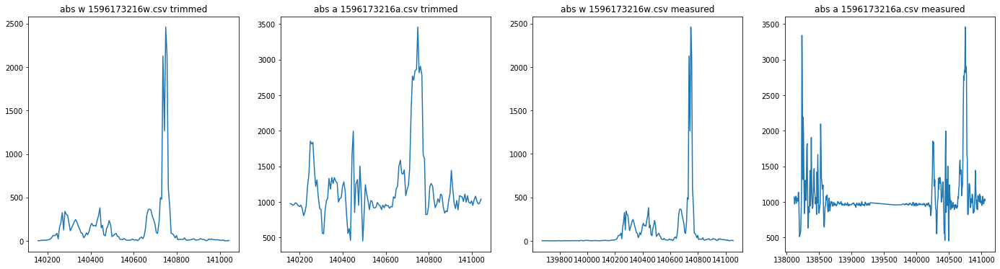



Missed Shot:


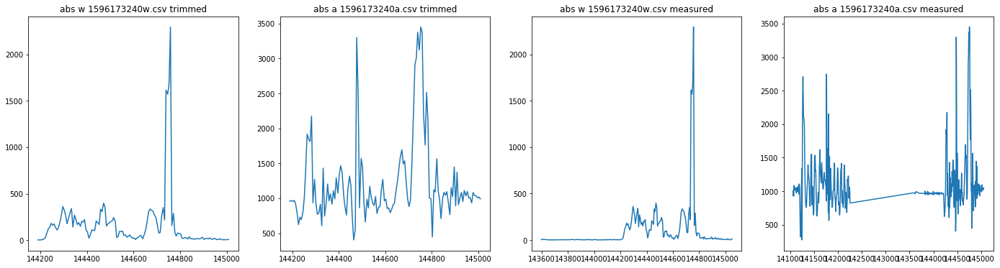



Missed Shot:


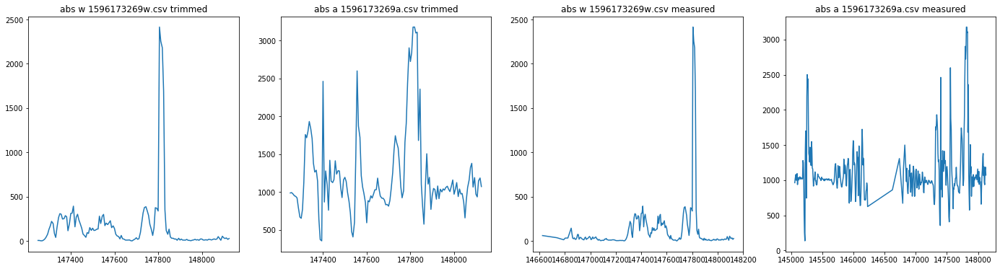



Made Shot:


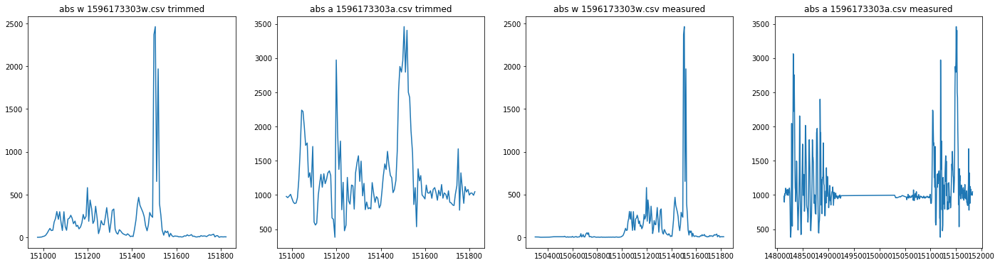



Missed Shot:


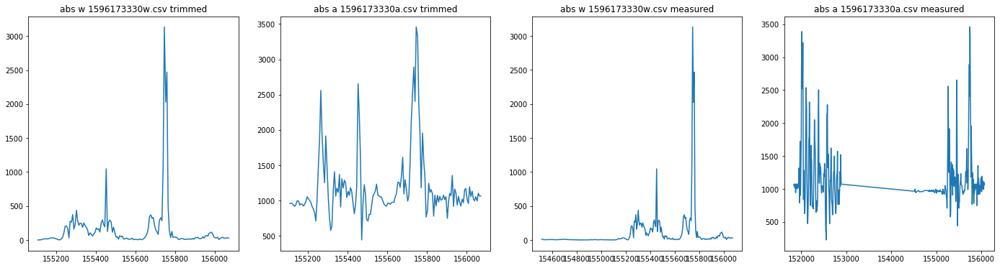



Missed Shot:


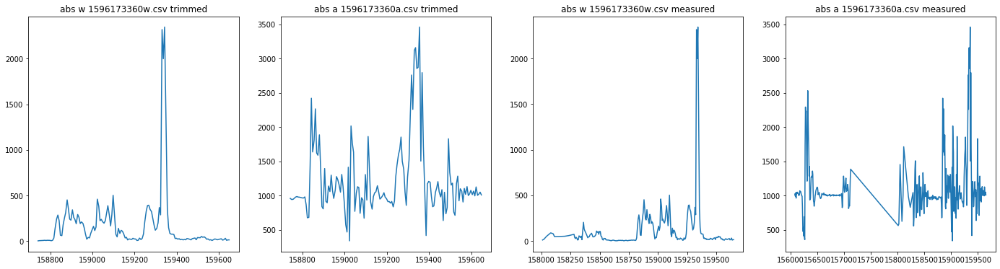



Missed Shot:


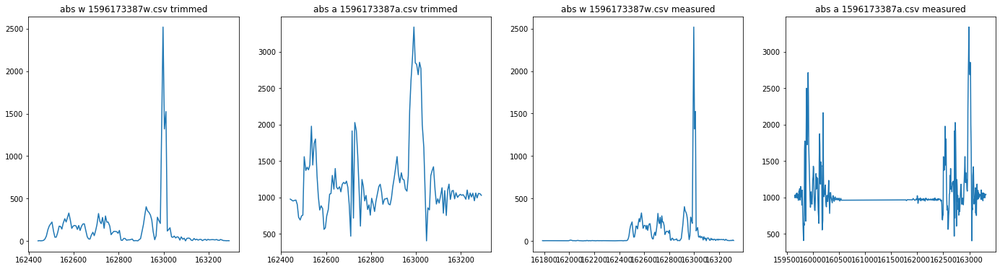



Missed Shot:


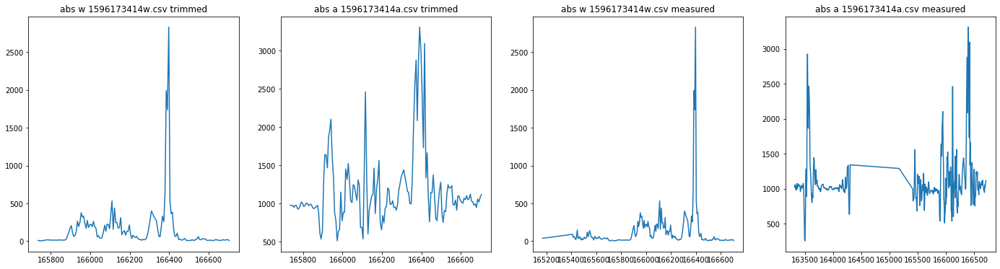



Made Shot:


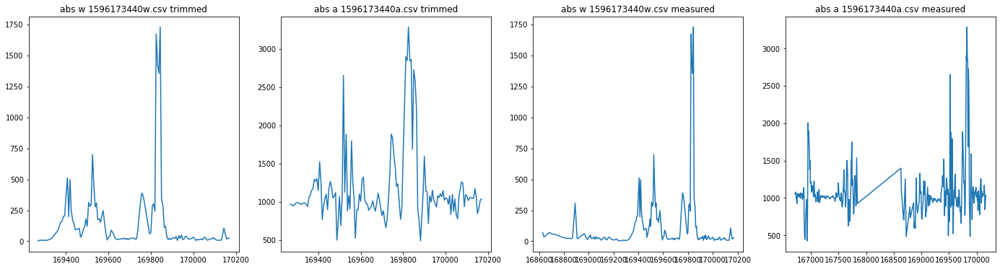



Missed Shot:


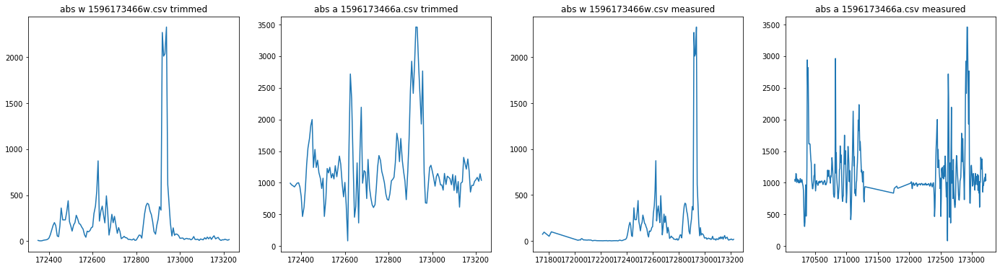



Made Shot:


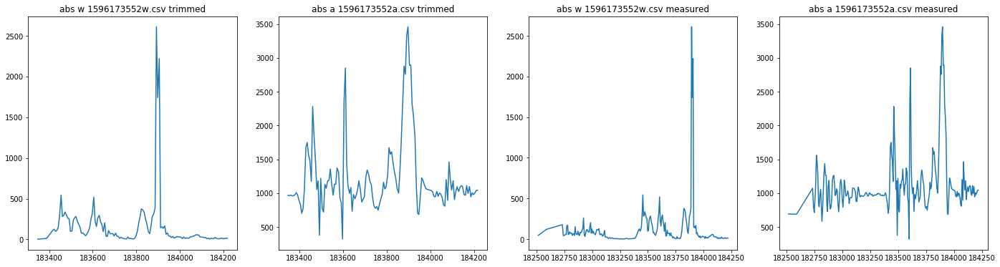



Made Shot:


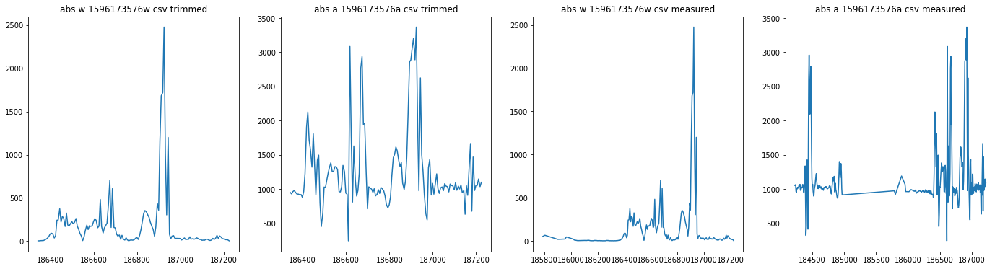



Made Shot:


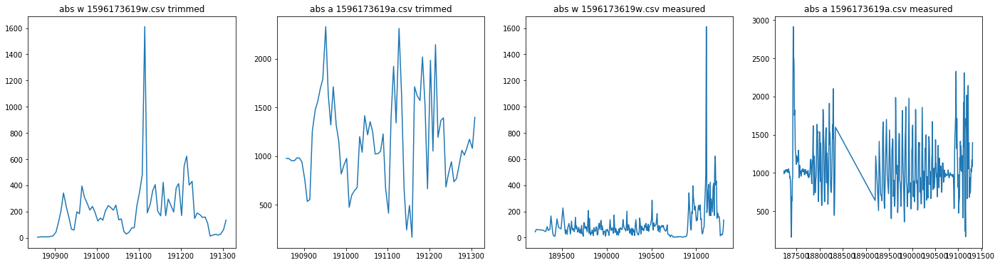



Missed Shot:


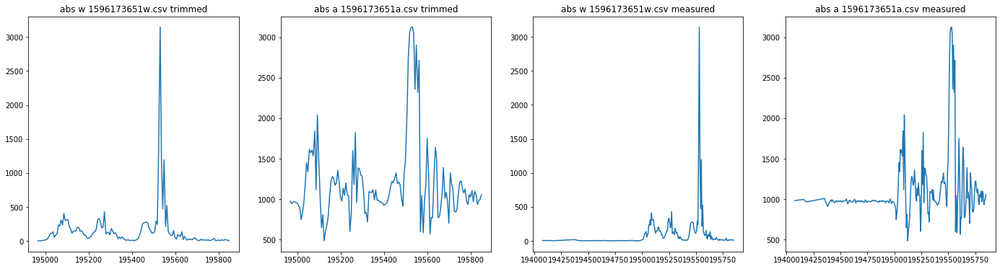



Missed Shot:


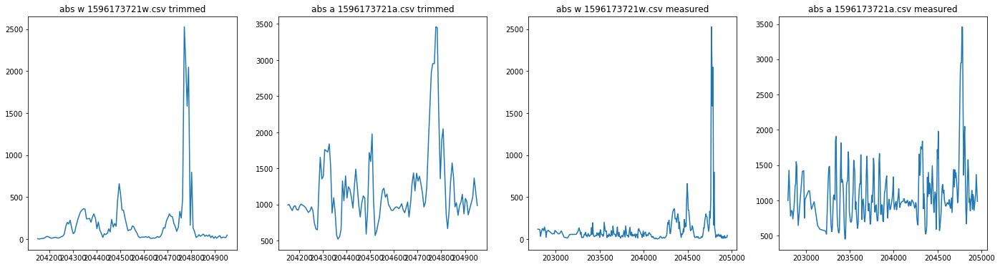



Made Shot:


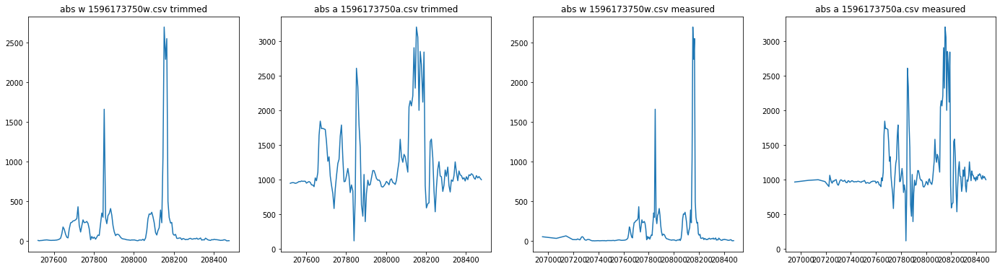



Made Shot:


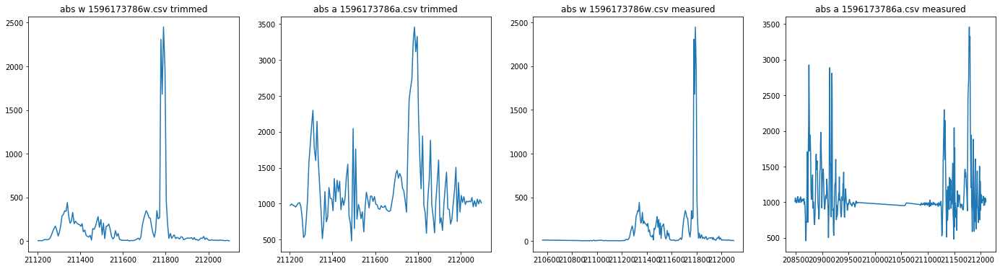



Missed Shot:


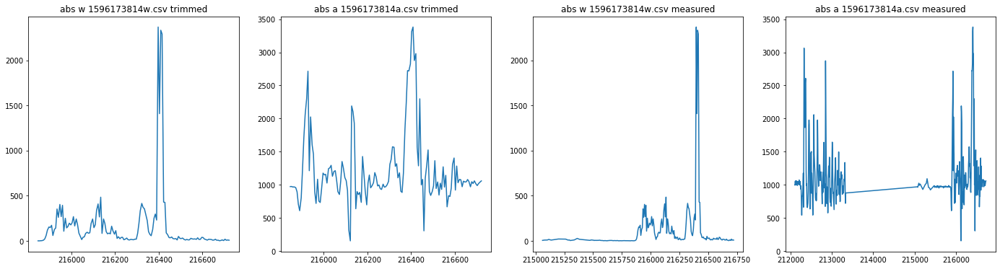



Missed Shot:


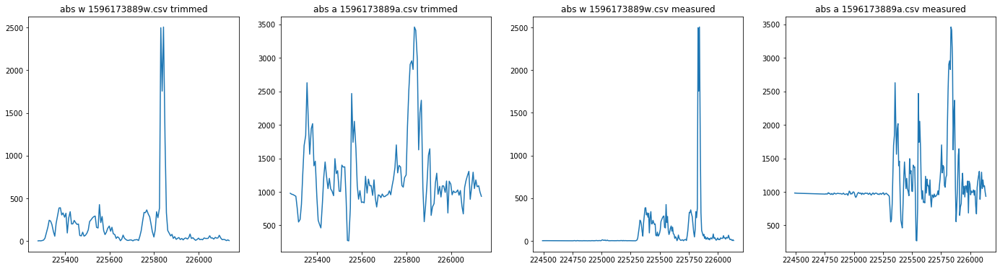



Missed Shot:


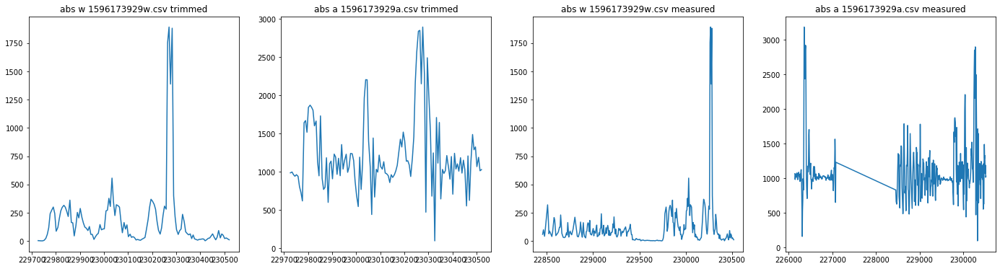



Made Shot:


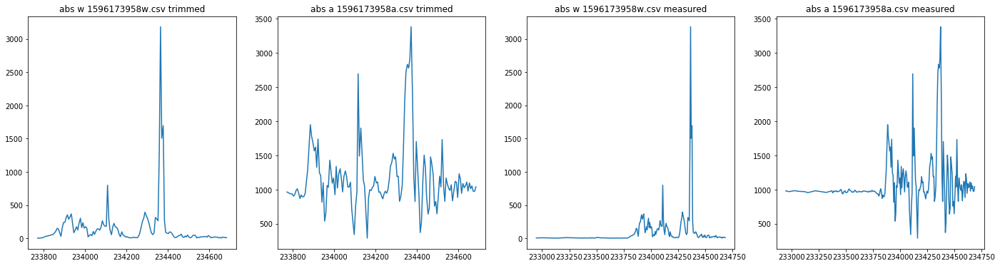



Made Shot:


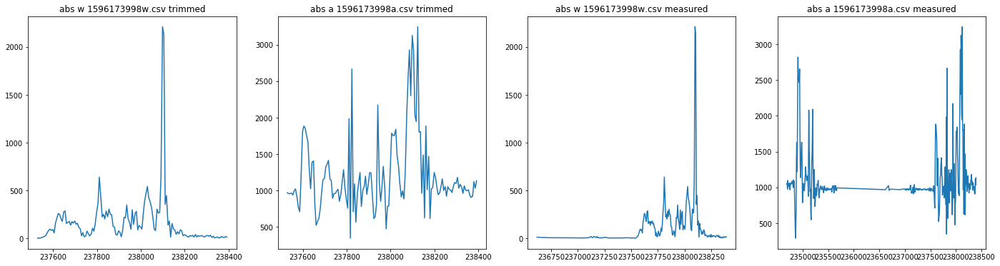



Made Shot:


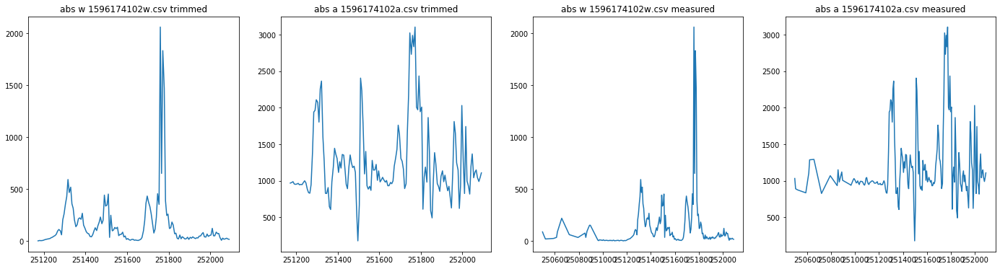



Missed Shot:


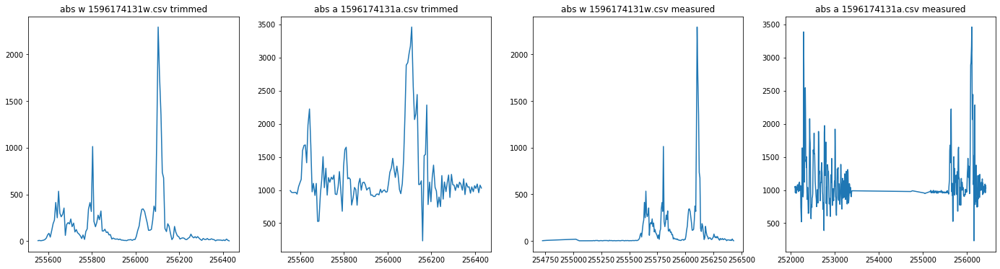



Missed Shot:


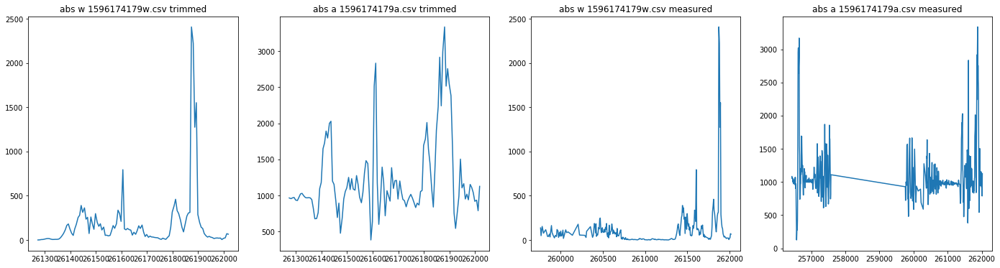



Made Shot:


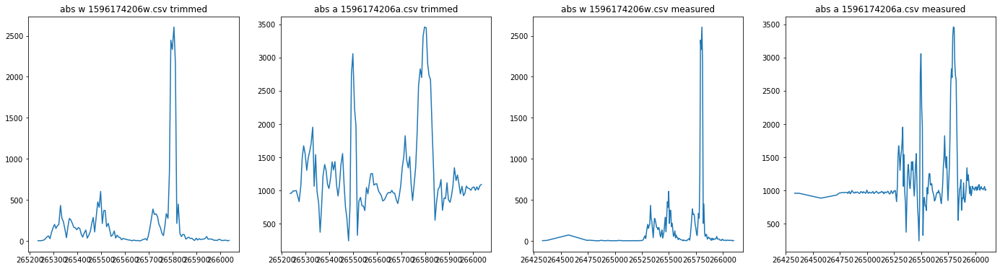



Missed Shot:


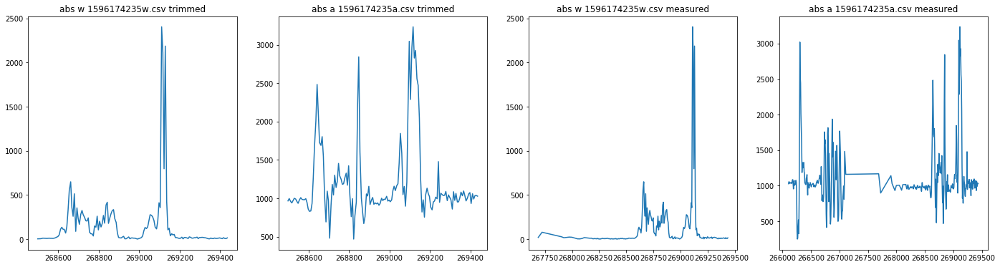



Missed Shot:


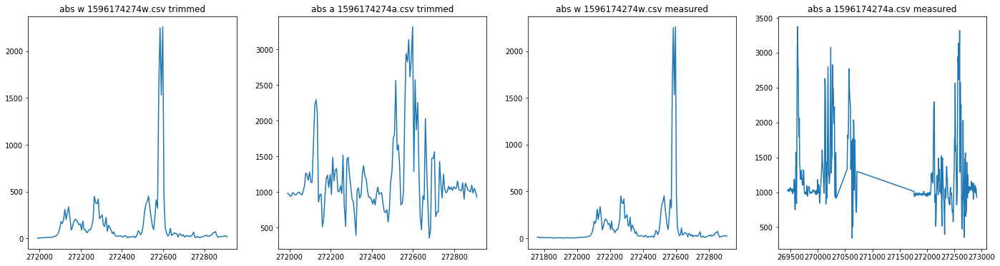



Made Shot:


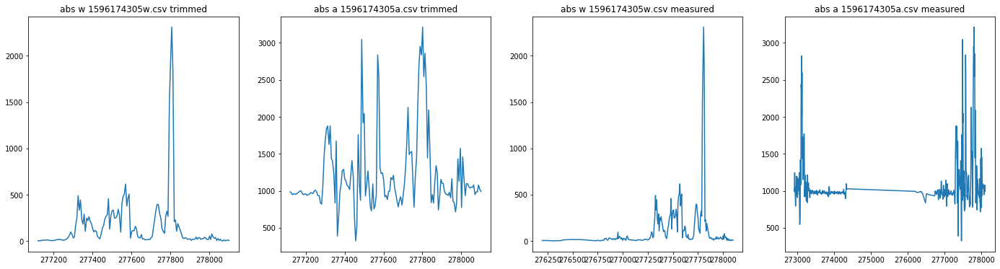



Missed Shot:


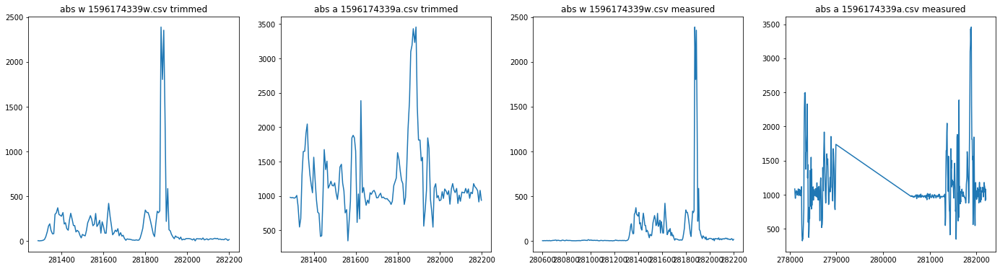



Missed Shot:


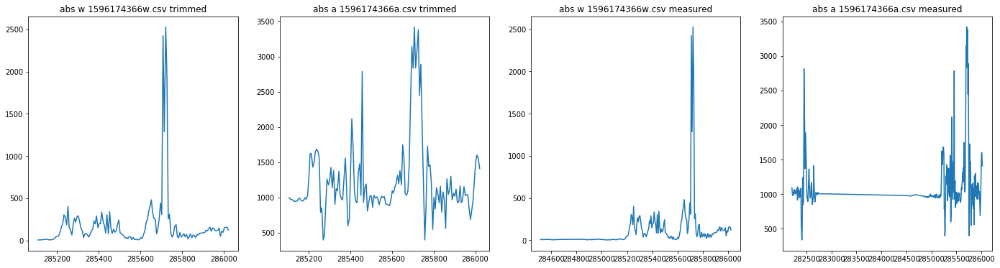



Made Shot:


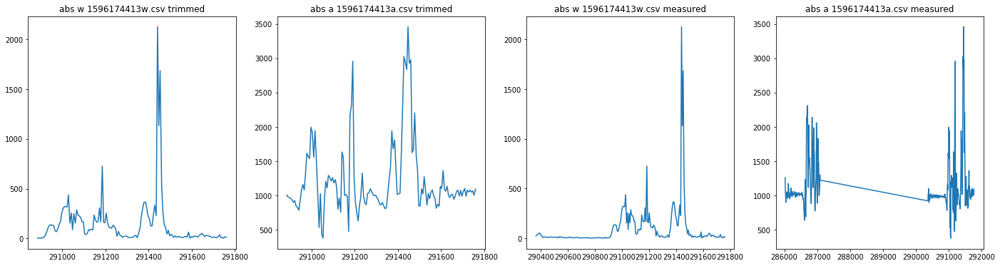



Missed Shot:


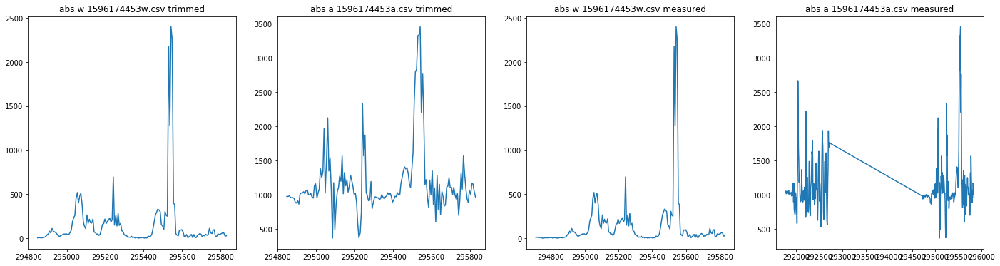



Missed Shot:


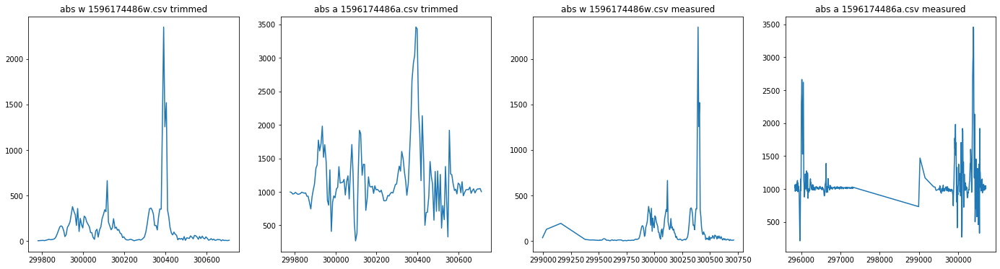



Made Shot:


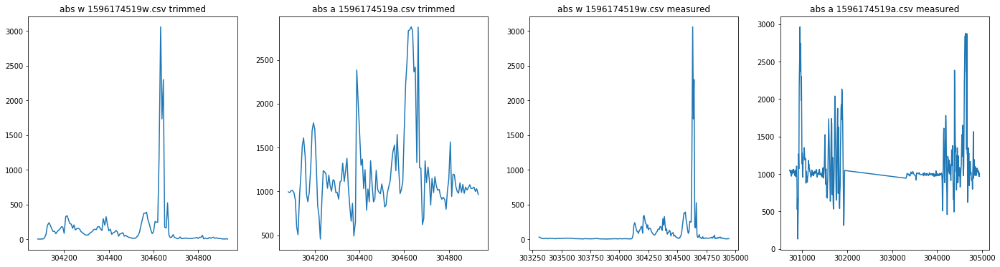



Missed Shot:


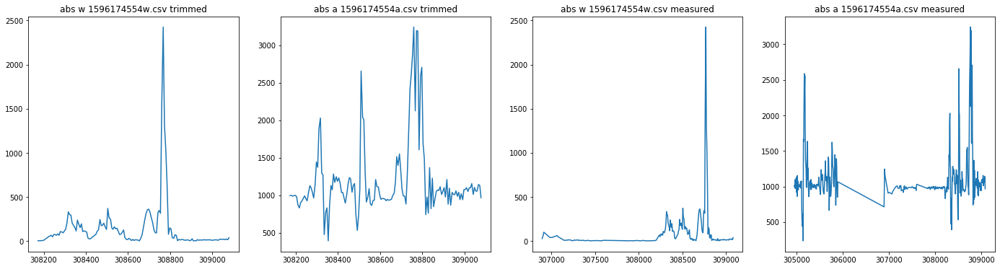



Missed Shot:


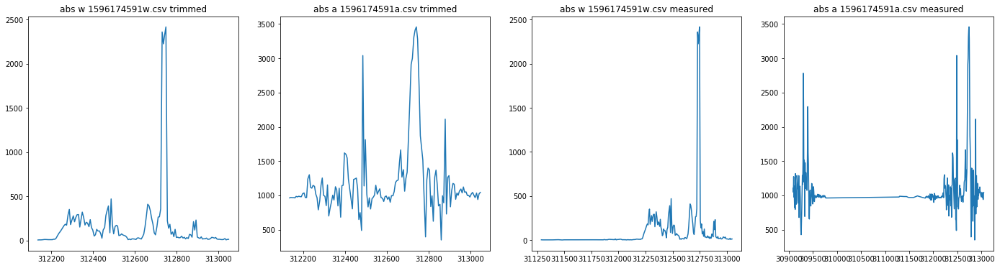



Missed Shot:


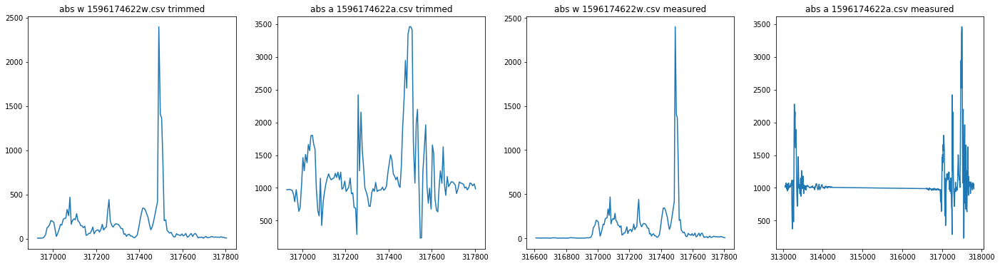



Made Shot:


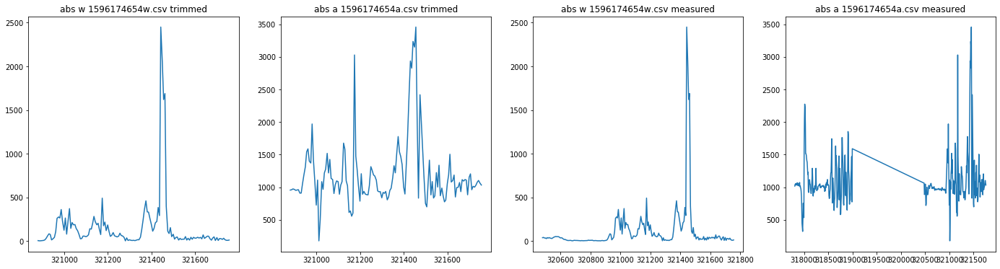



Missed Shot:


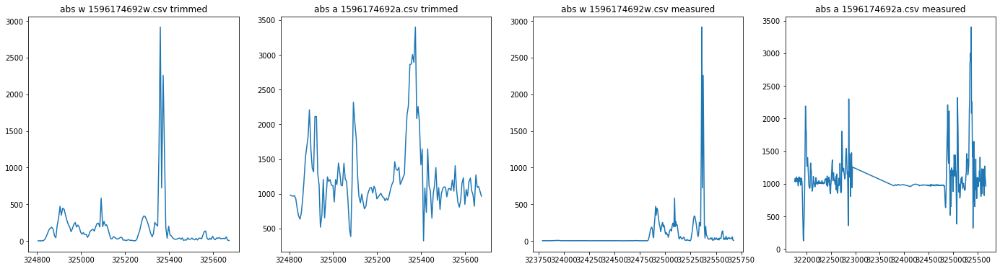



Made Shot:


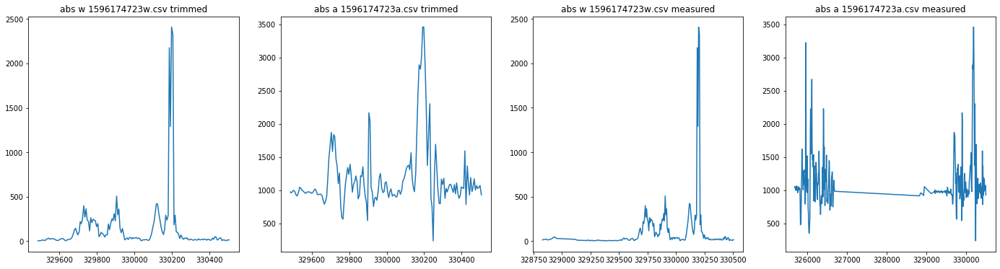



Made Shot:


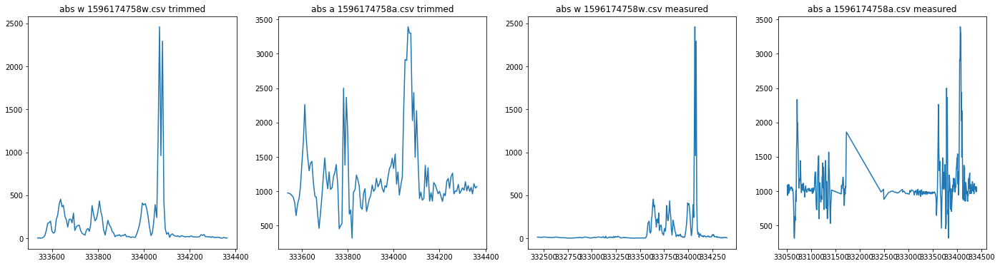



Missed Shot:


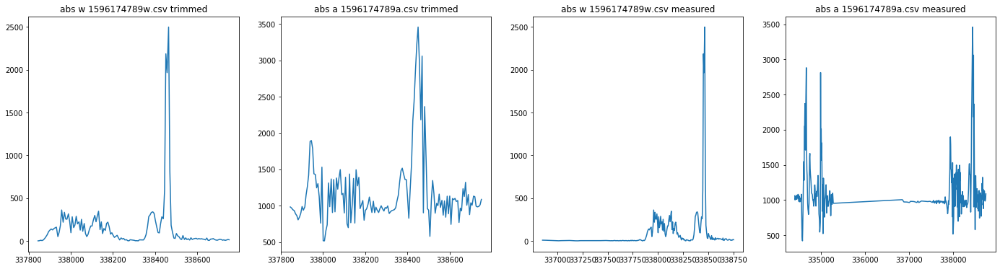



Made Shot:


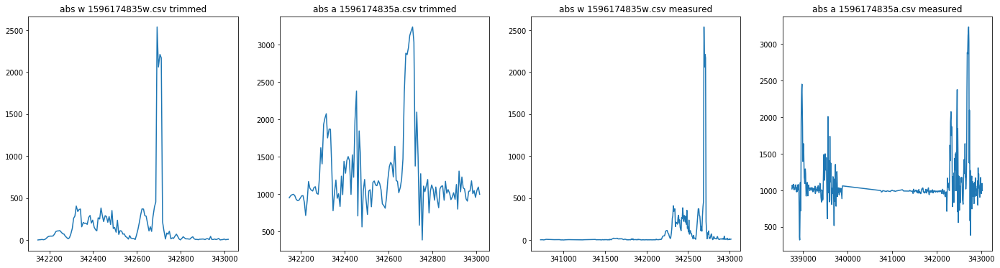



Made Shot:


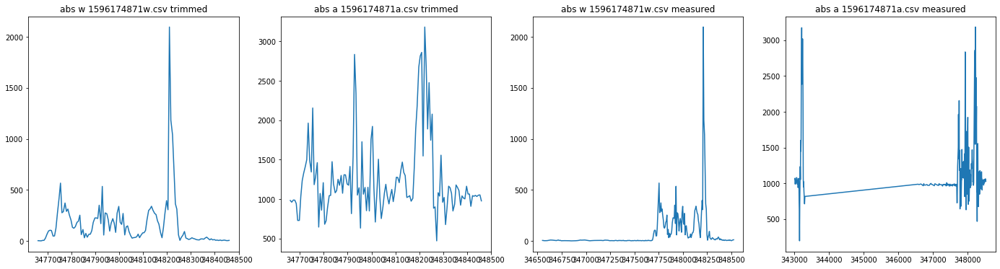



Missed Shot:


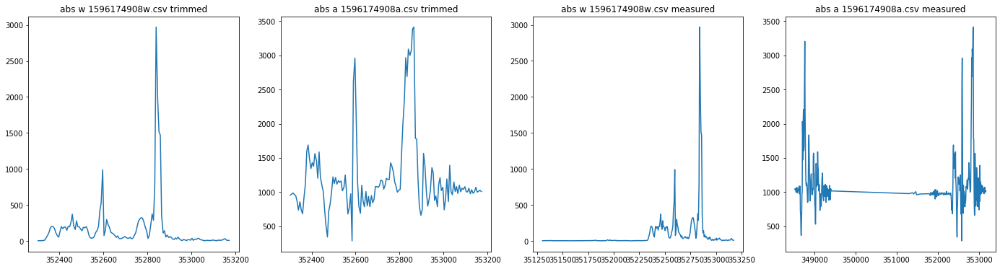



Made Shot:


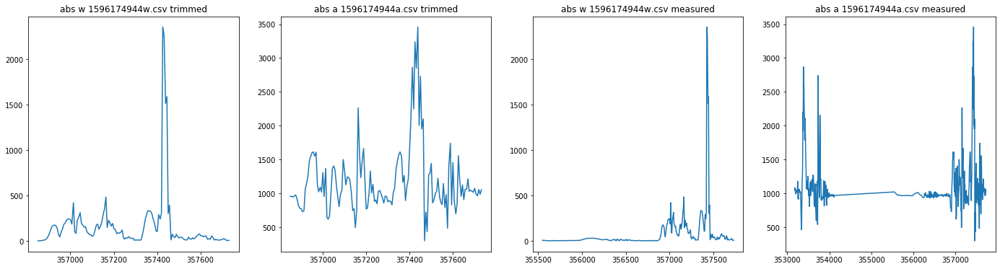



Made Shot:


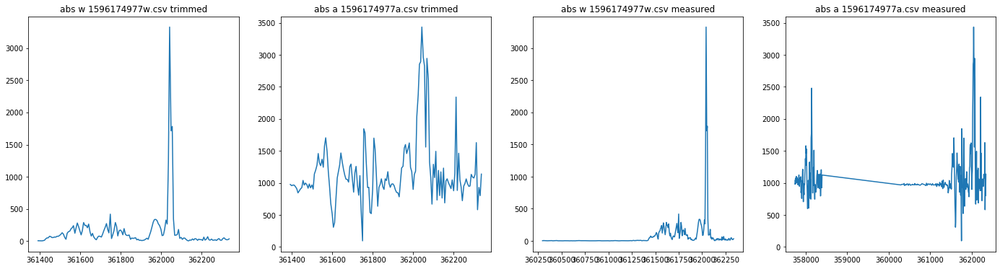



Missed Shot:


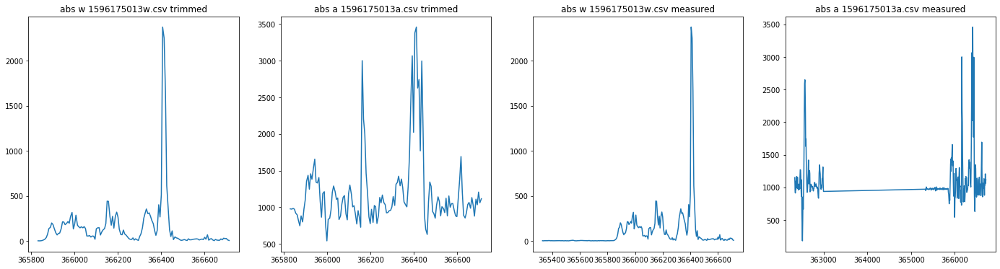



Made Shot:


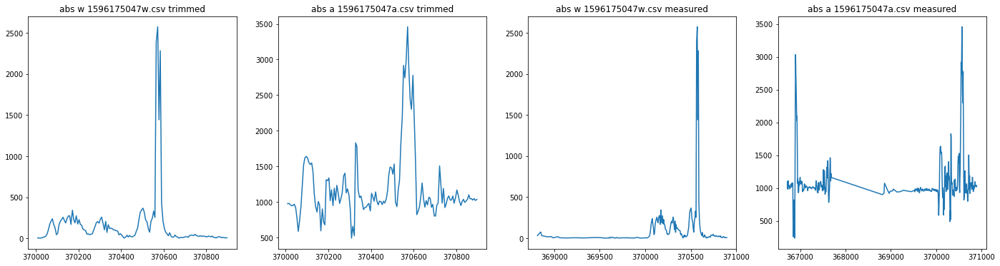



Missed Shot:


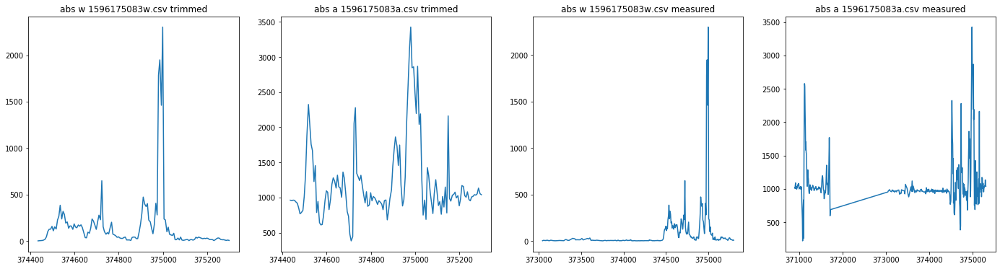



Made Shot:


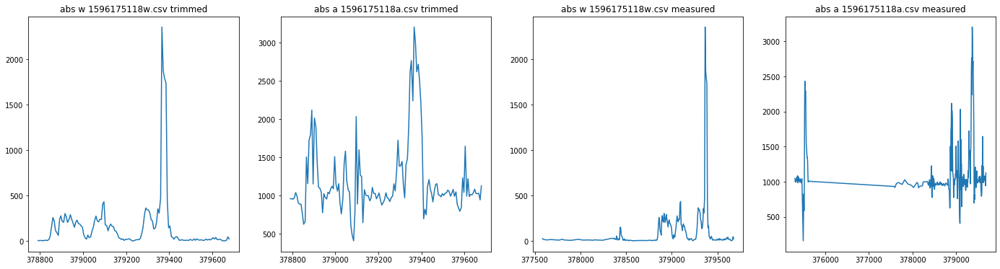



Missed Shot:


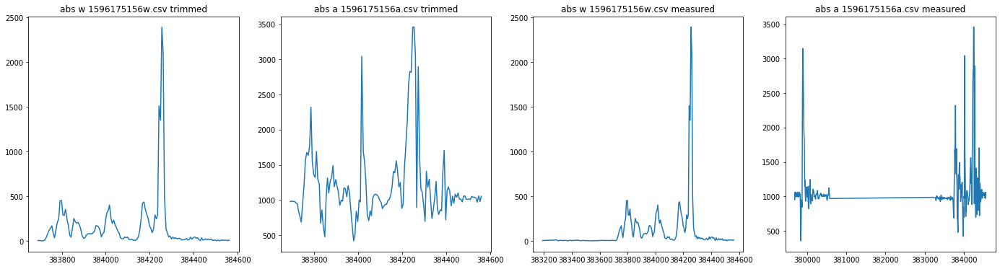



Missed Shot:


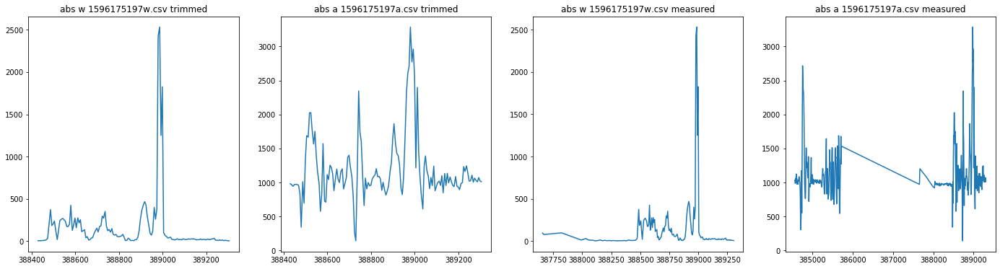



Made Shot:


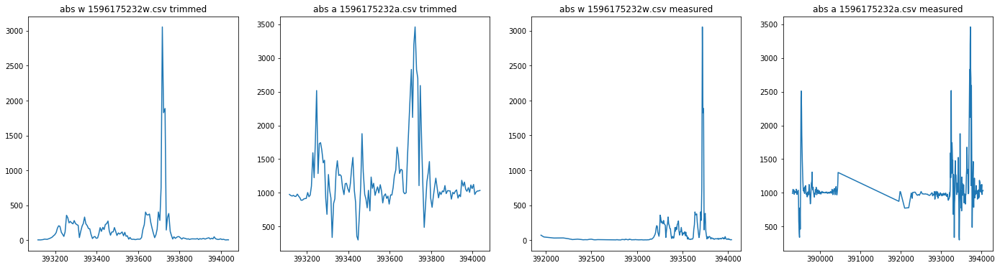



Missed Shot:


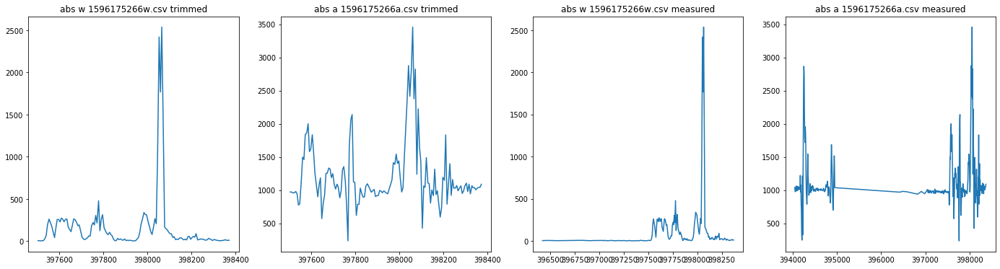



Made Shot:


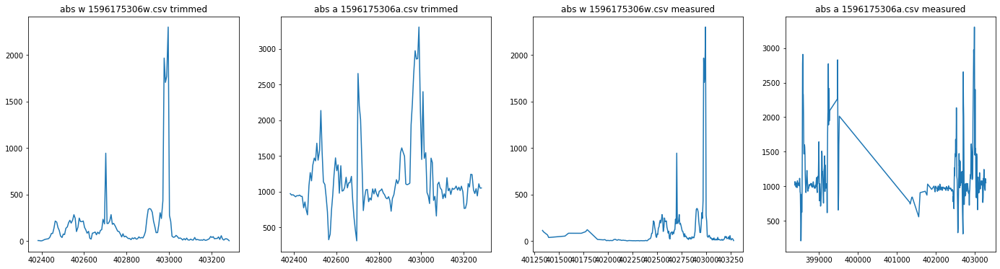



Made Shot:


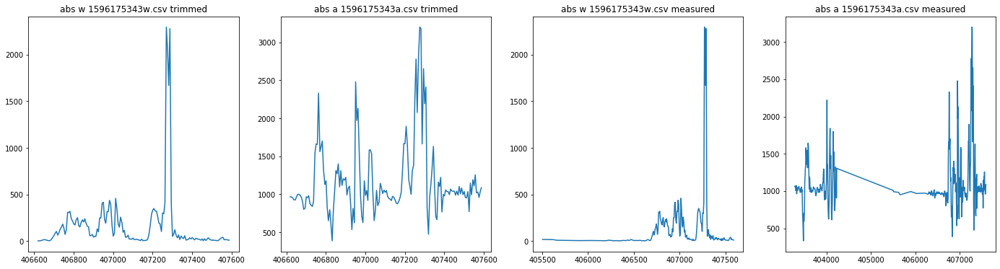



Missed Shot:


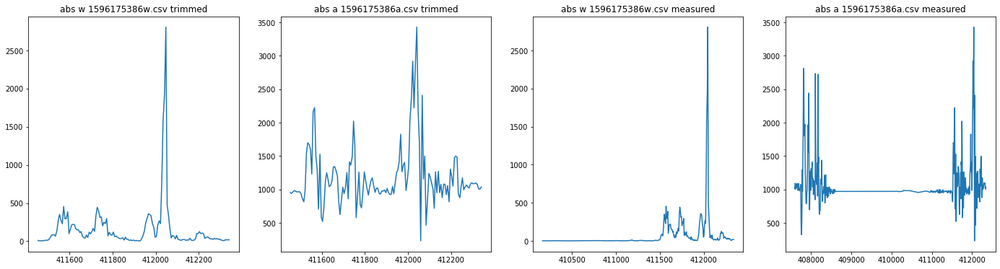



Made Shot:


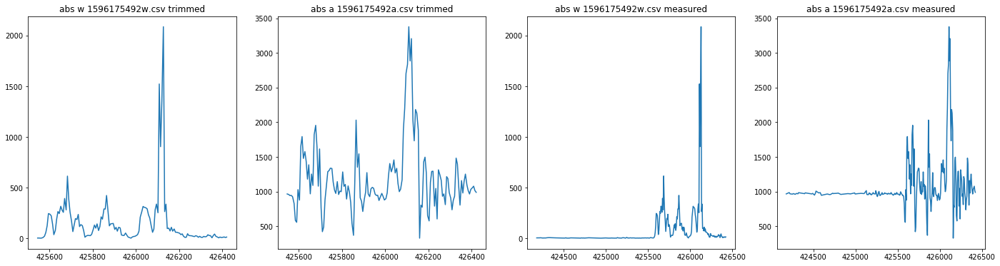



Missed Shot:


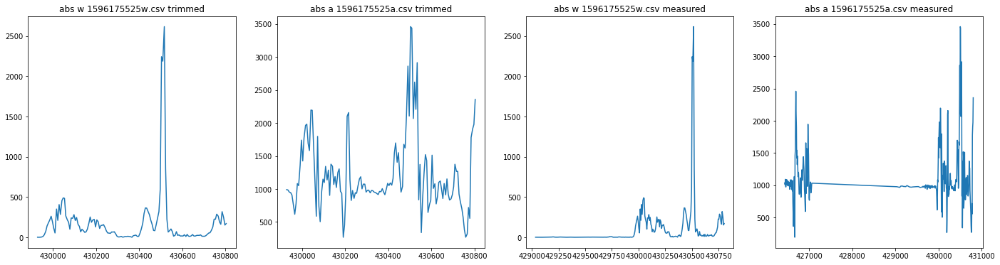



Made Shot:


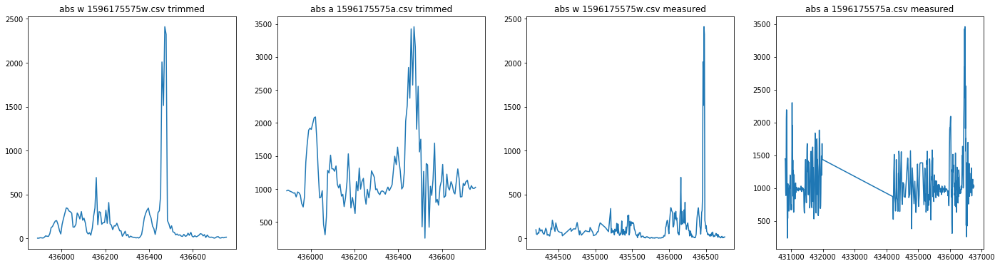



Made Shot:


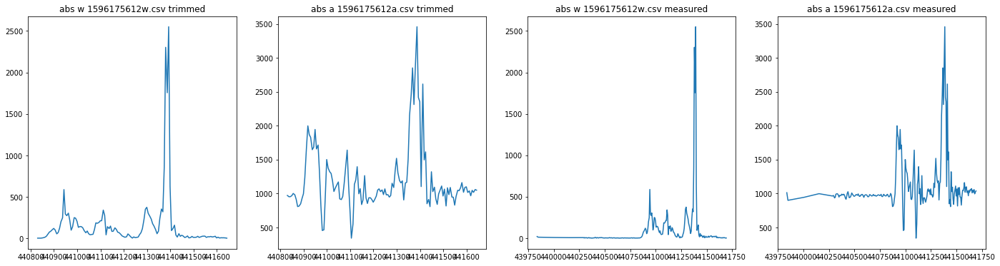



Made Shot:


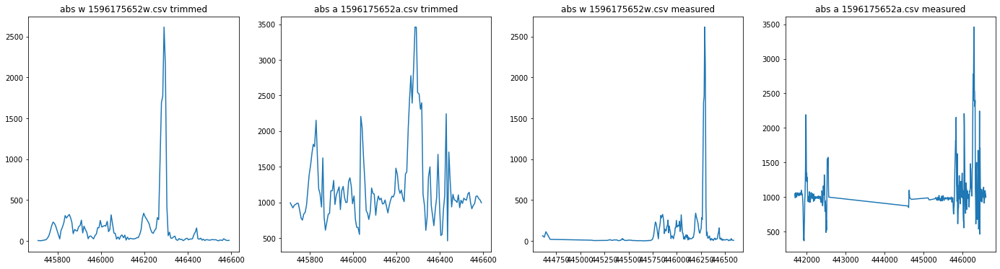



Missed Shot:


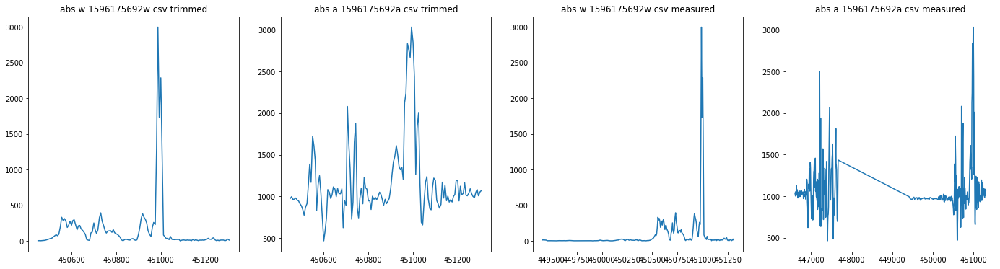



Made Shot:


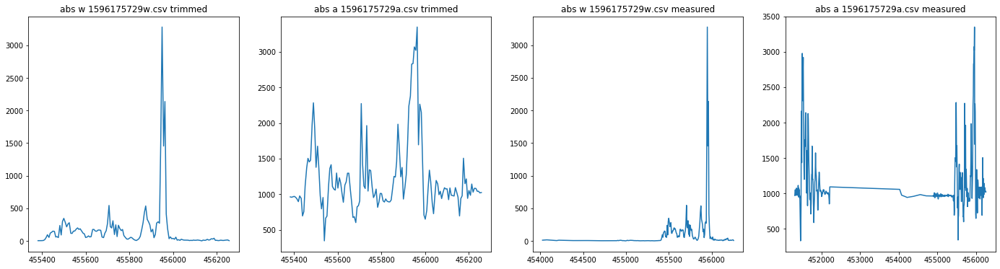



Made Shot:


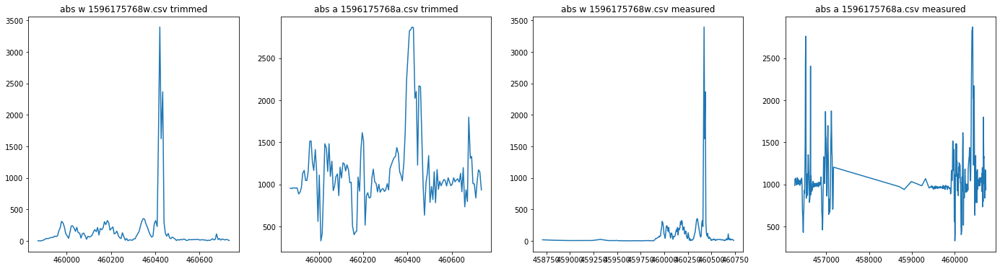



Made Shot:


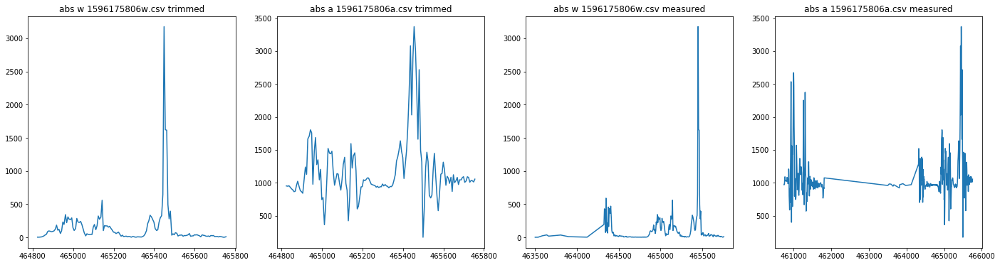



Missed Shot:


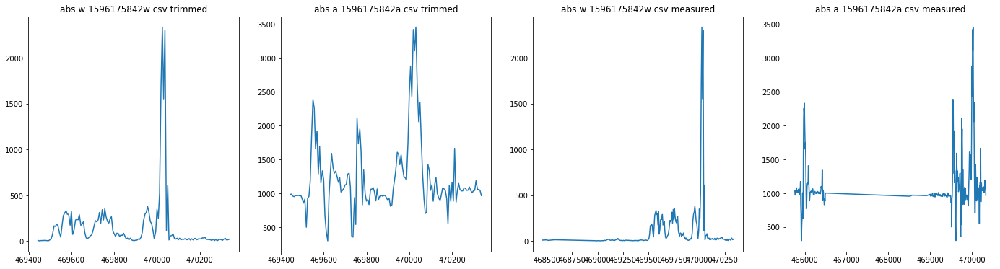



Missed Shot:


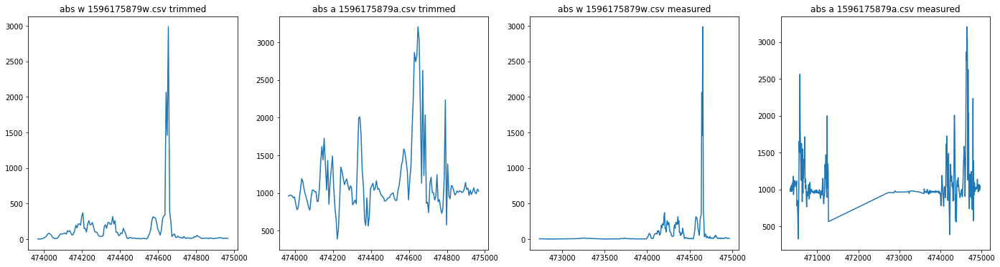



Made Shot:


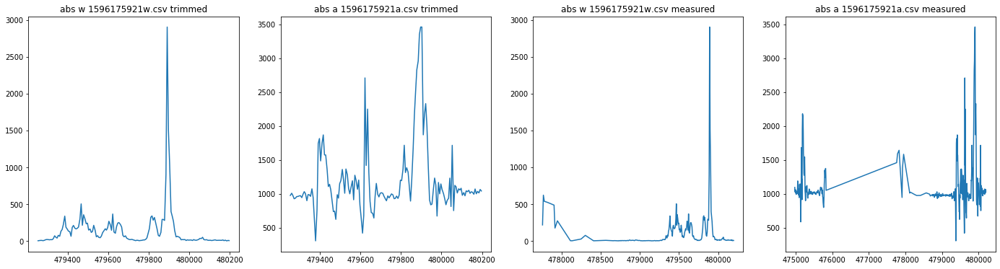



Missed Shot:


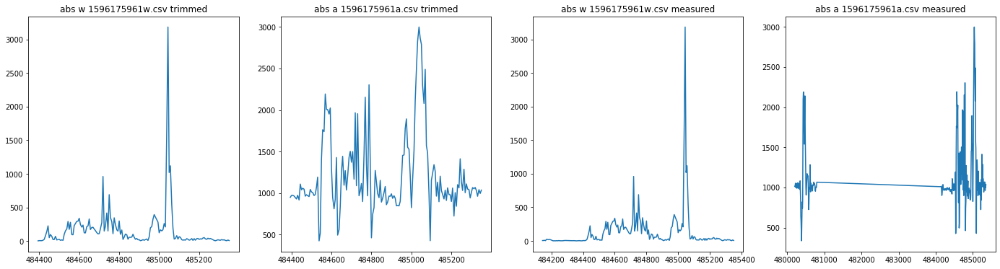



Missed Shot:


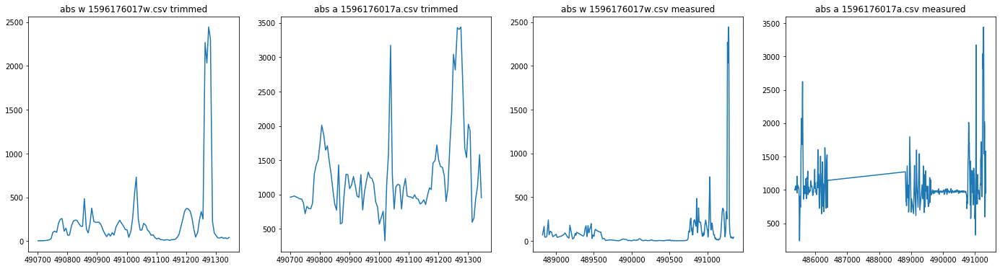



Made Shot:


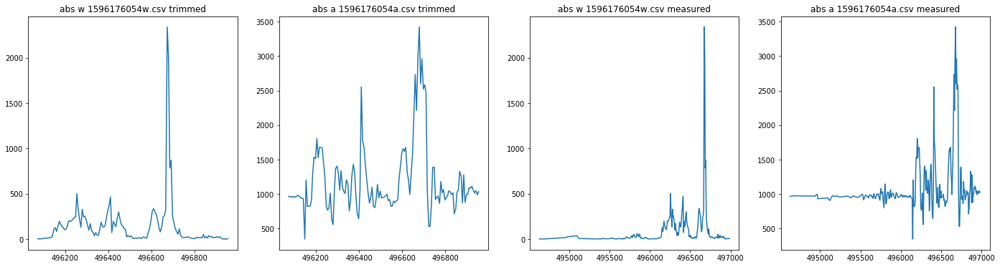

In [49]:
for n in range(1,100):
    a0 = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n])
    w0 = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n+1])
    w, a = trim_data(w0, a0)
    
    md_made = md[md['make']==1]
    made_files = md_made['file_name'].to_string()
    
    if len(w['time'])>0: 
        
        if files[2*n].split('a')[0] in made_files:
            print('Made Shot:')
        else:
            print("Missed Shot:")
            
        fig, ax = plt.subplots(1,4, figsize=(24,6))

        ax[0].set_title('abs w '+files[2*n+1] + ' trimmed')
        ax[0].plot(w['time'], np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2))

        ax[1].set_title('abs a '+files[2*n]+ ' trimmed')
        ax[1].plot(a['time'], np.sqrt(a['ax']**2+a['ay']**2+a['az']**2))

        ax[2].set_title('abs w '+files[2*n+1]+ ' measured')
        ax[2].plot(w0['time'], np.sqrt(w0['wx']**2+w0['wy']**2+w0['wz']**2))

        ax[3].set_title('abs a '+files[2*n]+ ' measured')
        ax[3].plot(a0['time'], np.sqrt(a0['ax']**2+a0['ay']**2+a0['az']**2))


        plt.show()
        
        print("\n")

<p><b>Finding the most complete signal</b></p>

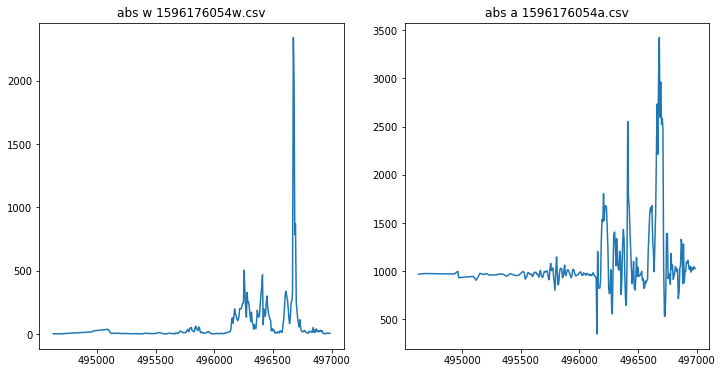

In [50]:
max_points = 0
a_max = []
w_max = []

for n in range(1,100):
    a = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n])
    w = pd.read_csv(dir+'FreeThrows_7_31/'+files[2*n+1])
    if len(a['time'])>max_points:
        max_points = len(a['time'])
        a_max = a
        w_max = w
    
fig, ax = plt.subplots(1,2, figsize=(12,6))

ax[0].set_title('abs w '+files[2*n+1])
ax[0].plot(w['time'], np.sqrt(w['wx']**2+w['wy']**2+w['wz']**2))

ax[1].set_title('abs a '+files[2*n])
ax[1].plot(a['time'], np.sqrt(a['ax']**2+a['ay']**2+a['az']**2))

plt.show()